# Setup

Libraries and helper functions

In [160]:
import pandas as pd
from pandas import read_csv
import geopandas as gpd
import os
import re
import numpy as np
import string
import zipfile
from bs4 import BeautifulSoup
from shapely.geometry import Polygon
import fiona
import io
from itertools import chain
from tqdm import tqdm
from collections import Counter
import pyproj

#Py file fxn import
from helper_functions import *

fiona.drvsupport.supported_drivers['KML'] = 'rw'

#Stop warnings about future changes to libraries from crowding output
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Set directory

In [161]:
#Set the working directory
project_folder = '/Users/grantschwab/Desktop/fl_2022_gen_pber'
os.chdir(project_folder)
wd = os.getcwd()

#Make folder for output files
if not os.path.exists("output"):
  os.mkdir("output")
  print("The 'output' folder has been created.")
else:
  print("The folder already exists.")

The folder already exists.


# Import election results and raw map files

Also:
- Initial cleaning
- County precinct counts, helpful for seeing which map sources align best with election results

## RDH results

In [162]:
#Read in RDH election results file
rdh = pd.read_csv('./raw-from-source/fl_2022_gen_prec.csv')

In [163]:
#Clean some precincts with unwanted ' ' instaces
#Isolated issue in ESC, STL and BAY counties

space_clean = rdh['CNTY_CODE'].isin(['ESC', 'STL', 'BAY'])
rdh.loc[space_clean, 'UNIQUE_ID'] = rdh.loc[space_clean, 'UNIQUE_ID'].str.replace(' ', '0')

In [164]:
#Group by 'CNTY_CODE' and count unique 'UNIQUE_ID' per county
rdh_group = rdh.groupby('CNTY_CODE')['UNIQUE_ID'].nunique().reset_index()

#Rename the 'UNIQUE_ID' column
rdh_group.rename(columns={'UNIQUE_ID': 'rdh_count'}, inplace=True)

rdh_group.head()

,CNTY_CODE,rdh_count
0,ALA,64
1,BAK,9
2,BAY,27
3,BRA,14
4,BRE,171


## VEST

In [165]:
#Read in VEST file
vest = gpd.read_file('./raw-from-source/update_fl_vest_20/fl_2020.shp')

In [166]:
#Rename cols to lowercase so code used for a previous version of VEST file comports with updated version
vest.rename(columns={'PCT_STD': 'pct_std', 'COUNTY': 'county'}, inplace=True)

In [167]:
#Clean pct_std column in VEST to match RDH style
vest['pct_std'] = vest['pct_std'].str[:3] + '-' + vest['pct_std'].str[3:]

In [168]:
#Group by 'CNTY_CODE' and count unique 'UNIQUE_ID' per county
vest_group = vest.groupby('county')['pct_std'].nunique().reset_index()

#Rename the columns for county prec count table
vest_group.rename(columns={'county': 'CNTY_CODE'}, inplace=True)
vest_group.rename(columns={'pct_std': 'vest_count'}, inplace=True)

vest_group.head()

,CNTY_CODE,vest_count
0,ALA,63
1,BAK,9
2,BAY,44
3,BRA,14
4,BRE,172


## Volunteer

In [169]:
#Files compiled by RDH volunteer Sebastian Pojman
#Processing steps later in notebook detail uses for original and revised version of file.

volunteer = gpd.read_file('./raw-from-source/volunteer_map_original/FL 2022 MASTER.shp')
volunteer_revised = gpd.read_file('./raw-from-source/volunteer_map_revised/2022 FL PRECINCT SHAPEFILE.shp')

In [170]:
#Create county column in original volunteer file
volunteer['CNTY_CODE'] = volunteer.pct_std.str[:3]

#Create same column in revised file, useful for integrating select counties later
volunteer_revised['CNTY_CODE'] = volunteer_revised.pct_std.str[:3]

#Group by 'CNTY_CODE' and count unique 'UNIQUE_ID' per county
volunteer_group = volunteer.groupby('CNTY_CODE')['pct_std'].nunique().reset_index()

#Rename the 'pct_std' column for county prec count table
volunteer_group.rename(columns={'pct_std': 'vol_count'}, inplace=True)

volunteer_group.head()

,CNTY_CODE,vol_count
0,ALA,64
1,BAK,9
2,BAY,29
3,BRA,14
4,BRE,175


## State files

### Batch import/aggregation of SHP files

In [171]:
#Files come directly from Supervisor of Elections offices in select counties

county_shps = [
    './raw-from-source/state-files/BRE/BRE20220727_PctMap22f3544c-1024-4c53-83a6-f7dd9c2baf5d/PctMap.shp',
    './raw-from-source/state-files/CLA/CLA20220520_PctMapFile_Reprecincting86cf302e-0733-491c-8db6-d668c978281e/Clay_region.shp',
    './raw-from-source/state-files/SUM/SUM20220623_PctMap8ab9071b-d732-47c4-9288-3debbb1ffff6/SumterVotingPrecincts.shp',
    './raw-from-source/state-files/CIT/CIT20220426_PctMapd44f94d9-4b99-4b18-aabe-b00ef6a613ad/PRECINCT-4-2022_region.shp',
    './raw-from-source/state-files/CLL/CLL_PCTMap/PRECINCT12021_region.shp',
    './raw-from-source/state-files/FLA/FLA20220510_PctBlock_region06541b5f-c233-44b9-b90c-fca75c76a03a.shp',
    './raw-from-source/state-files/MRN/MRN20220627_PctMap17021ebc-25a4-4c98-8fd1-91d121b875fa.shp',
    './raw-from-source/state-files/NAS/NAS20220515_PrecinctMap6cbbd7df-da29-4f06-bab7-0712f8be9308/NAS20220515_Current_region.shp',
    './raw-from-source/state-files/HIL/PRECINCTS_10102022.shp',
    './raw-from-source/state-files/PAL/Precincts_2022.shp']

In [172]:
#Define a function to loop thru SHP file list and append to a master GDF

def shp_aggregator(county_shps):
  county_geo = gpd.GeoDataFrame()

  for shp_file in county_shps:

    #Create a new shp geodataframe
    shp_temp = gpd.read_file(shp_file, errors='ignore')

    #Set common CRS
    shp_temp = shp_temp.to_crs(vest.crs)

    #Set folder path mask
    folder_name = os.path.basename(os.path.dirname(shp_file))

    #Set county name column
    shp_temp['CNTY_CODE_messy'] = folder_name

    #Set cleaner version
    shp_temp['CNTY_CODE'] = shp_temp['CNTY_CODE_messy'].str[:3]

    #Append to master
    county_geo = pd.concat([county_geo, shp_temp], ignore_index=True)

  return county_geo

In [173]:
#Run function and assign to GDF
county_geo = shp_aggregator(county_shps)

#Set to common CRS
county_geo = county_geo.to_crs(vest.crs)

In [174]:
#Make sure all desired counties are included
county_geo.CNTY_CODE.unique()

array(['BRE', 'CLA', 'SUM', 'CIT', 'CLL', 'FLA', 'MRN', 'NAS', 'HIL',
       'PAL'], dtype=object)

In [175]:
county_geo.head()

,OBJECTID,GEOID20,GEOID_Spli,Precinct,Commission,Congress,CityNum,House,CPA,RecDist,...,NAME,COUNTY,LASTUPDATE,LASTEDITOR,GlobalID,SHAPE_STAr,SHAPE_STLe,PrecinctNa,GRP,AREA
0,1.0,120090645001013,120090645001013,403.1,4.0,8.0,7.0,32.0,0.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,120090645002004,120090645002004,507.1,5.0,8.0,7.0,32.0,0.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,120090645002002,120090645002002,507.1,5.0,8.0,7.0,32.0,0.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.0,120090644003004,120090644003004,507.1,5.0,8.0,7.0,32.0,0.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,120090645001026,120090645001026,403.1,4.0,8.0,7.0,32.0,0.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Separate imports for CHA, ALA and GLA counties

CHA

In [176]:
#Import separate b/c RDH manually matched up precs from county map to correspond to election results file 
#RDH received map file on 10/13 from CHA county

cha_csv = pd.read_csv('./raw-from-source/state-files/CHA/CHA_precincts_2022.csv')
cha_shp = gpd.read_file('./raw-from-source/state-files/CHA/CHA_Precinct_2022/Precinct_2022.shp')

cha_csv['precinct'] = cha_csv.PG_Precinc.astype(float)
cha_shp['precinct'] = cha_shp['PG_Precinc'].astype(float)

cha = pd.merge(cha_csv, cha_shp, on='precinct', how='right')

cha = gpd.GeoDataFrame(cha, geometry='geometry')
pd.options.display.max_rows = 20

cha['UNIQUE_ID'] = cha.UNIQUE_ID.astype(str)

#Make sure crs same as VEST
cha = cha.to_crs(vest.crs)

ALA

In [177]:
#Import separate because it is a KMZ file

kmz_file = './raw-from-source/state-files/ALA/Alachua County Voting Precincts and Districts.kmz'

#Open the KMZ file as bytes
with open(kmz_file, 'rb') as f:
    kmz_data = f.read()

#Extract the KML data from the KMZ archive
with zipfile.ZipFile(io.BytesIO(kmz_data)) as kmz:
    kml_data = kmz.read('doc.kml')  # Adjust the file path as needed

#Read the KML data into a GeoDataFrame
ala = gpd.read_file(io.BytesIO(kml_data), driver='KML')

#Make County col
ala['CNTY_CODE'] = 'ALA'

#Make sure crs same as VEST
ala = ala.to_crs(vest.crs)

GLA

<Axes: >

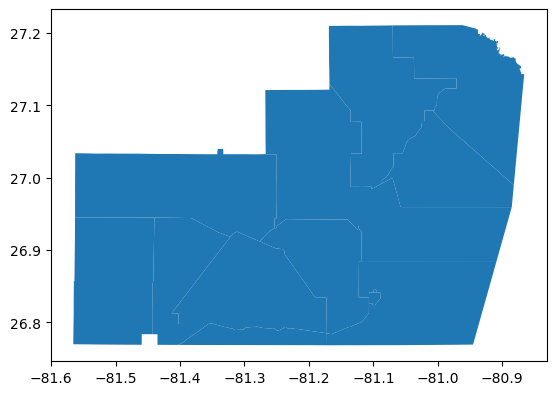

In [178]:
#Import separate because it is a GPKG file
gla = gpd.read_file('./raw-from-source/state-files/GLA/new_glades.gpkg')

#Make county col
gla['CNTY_CODE'] = 'GLA'
gla['COUNTYFP20'] = '043'

#Make sure crs same as VEST
gla = gla.to_crs(vest.crs)

gla.plot()

### Merge files together

In [179]:
state_gis = pd.concat([county_geo, ala], ignore_index=True)
state_gis = pd.concat([state_gis, cha], ignore_index=True)
state_gis = pd.concat([state_gis, gla], ignore_index=True)

In [180]:
state_gis.CNTY_CODE.unique()

array(['BRE', 'CLA', 'SUM', 'CIT', 'CLL', 'FLA', 'MRN', 'NAS', 'HIL',
       'PAL', 'ALA', 'CHA', 'GLA'], dtype=object)

# County prec counts

## RDH, VEST, and Volunteer prec counts

In [181]:
counts = pd.merge(pd.merge(rdh_group,vest_group,on='CNTY_CODE'),volunteer_group,on='CNTY_CODE')

In [182]:
#First 3 equal column
counts['first_three_equal'] = (counts['rdh_count'] == counts['vest_count']) & (counts['vest_count'] == counts['vol_count'])

## State file prec counts

In [183]:
#Group by 'CNTY_CODE' and count unique 'UNIQUE_ID' per county
county_group = state_gis.groupby('CNTY_CODE')['Precinct'].nunique().reset_index()

#Rename
county_group.rename(columns={'Precinct': 'state_count'}, inplace=True)

#Look at data
county_group

,CNTY_CODE,state_count
0,ALA,0
1,BRE,171
2,CHA,0
3,CIT,0
4,CLA,0
5,CLL,0
6,FLA,0
7,GLA,0
8,HIL,0
9,MRN,0


In [184]:
#Calculate the number of unique "PRECINCT" values for each group of "CNTY_CODE"
PRECINCT_count = state_gis.groupby('CNTY_CODE')['PRECINCT'].nunique()
geo_count = state_gis.groupby('CNTY_CODE')['geometry'].nunique()

#Update "Precincts" column where it's equal to 0
county_group.loc[county_group['state_count'] == 0, 'state_count'] = county_group['CNTY_CODE'].map(PRECINCT_count)
county_group.loc[county_group['state_count'] == 0, 'state_count'] = county_group['CNTY_CODE'].map(geo_count)

county_group

,CNTY_CODE,state_count
0,ALA,64
1,BRE,171
2,CHA,72
3,CIT,31
4,CLA,48
5,CLL,66
6,FLA,21
7,GLA,13
8,HIL,448
9,MRN,105


In [185]:
count_stateFiles = county_group

## Combine all prec counts

In [186]:
counts = pd.merge(counts,count_stateFiles,how='left', on='CNTY_CODE')

In [187]:
#Export this dataframe to compare number of county precincts for main map source files
counts

,CNTY_CODE,rdh_count,vest_count,vol_count,first_three_equal,state_count
0,ALA,64,63,64,False,64.0
1,BAK,9,9,9,True,NaN
2,BAY,27,44,29,False,NaN
3,BRA,14,14,14,True,NaN
4,BRE,171,172,175,False,171.0
...,...,...,...,...,...,...
62,UNI,8,8,8,True,NaN
63,VOL,136,125,164,False,NaN
64,WAK,12,12,12,True,NaN
65,WAL,21,21,20,False,NaN


# Create maps from census block assignment files

Building precinct maps from block IDs in certain counties

## Imports

In [188]:
#Read in file with all census blocks for state of Florida
all_blocks = gpd.read_file('./raw-from-source/fl_blocks/tl_2022_12_tabblock20.shp')

In [189]:
#View data
all_blocks.GEOID20 = all_blocks.GEOID20.astype(str)
all_blocks.head()

,STATEFP20,COUNTYFP20,TRACTCE20,BLOCKCE20,GEOID20,NAME20,MTFCC20,UR20,UACE20,UATYPE20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,HOUSING20,POP20,geometry
0,12,011,110313,3002,120111103133002,Block 3002,G5040,U,56602,U,S,10373,0,+26.0141395,-080.2458977,110,244,"POLYGON ((-80.24639 26.01462, -80.24544 26.014..."
1,12,011,091300,3005,120110913003005,Block 3005,G5040,U,56602,U,S,16084,0,+26.0148914,-080.2389650,20,65,"POLYGON ((-80.23997 26.01522, -80.23958 26.015..."
2,12,011,090601,2022,120110906012022,Block 2022,G5040,U,56602,U,S,15707,0,+26.0324326,-080.2376386,20,71,"POLYGON ((-80.23865 26.03275, -80.23825 26.032..."
3,12,011,020322,2008,120110203222008,Block 2008,G5040,U,56602,U,S,10859,0,+26.2396677,-080.2675230,10,35,"POLYGON ((-80.26821 26.23946, -80.26818 26.239..."
4,12,011,020406,4010,120110204064010,Block 4010,G5040,U,56602,U,S,7148,0,+26.2164976,-080.2430977,12,27,"POLYGON ((-80.24338 26.21614, -80.24337 26.216..."


In [190]:
#Counties we will include are Escambia, Orange, Broward, Miami-Dade, Lee, Osceola and St. Lucie. 
#FIPS code below correspond in that order.
county_codes = ['033','095','086', '071', '097', '111']

build_blocks = all_blocks[all_blocks.COUNTYFP20.isin(county_codes)]

<Axes: >

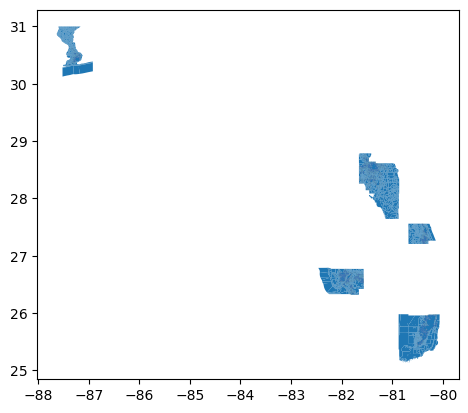

In [191]:
build_blocks.plot()

In [192]:
#Import precinct block assignment files

'''
Changes made by RDH staff to source files:

DAD -- changed columns in txt files to standardize*; also matched prec IDs used by county to IDs used by RDH
LEE -- standardized columns
OSC -- added column headings
STL -- added column headings
ESC -- standardized columns
ORA -- standardized columns

*Standardized column headings are: CNTY_CODE, Precinct, GEOID20
'''

geoid_files = [
    './raw-from-source/state-files/DAD/DAD_remap_20220623.csv',
    './raw-from-source/state-files/LEE/LEE20220629_PctBlock4500de9d-6de4-44c8-99e8-4708b18a1fd6.csv',
    './raw-from-source/state-files/OSC/OSC20220513_PctBlock51b82e5f-6ac9-45e1-98b3-80c439a4120b.csv',
    './raw-from-source/state-files/STL/STL20220615_PctBlock2fc43d81-1cc1-4eaf-8472-9f4078549ca2.csv',
    './raw-from-source/state-files/ESC/ESC20220520_PctBlock5e3e4f2a-d52b-4b84-a9ae-b51cac1eeefc.csv',
    './raw-from-source/state-files/ORA/ORA20220607_PctBlockb6f991de-f6ec-42f3-9dea-af465f481974.csv']

precs = pd.DataFrame()

for i in geoid_files:
  temp = pd.read_csv(i)
  precs = pd.concat([precs, temp], ignore_index=True)

In [193]:
#Initial cleaning
precs['Precinct'] = precs['Precinct'].astype(str).str.replace("\.0","",regex=True)
precs['GEOID20'] = precs.GEOID20.astype(str)
precs['pct_std'] = precs.CNTY_CODE + "-" + precs.Precinct.str.zfill(4)
precs.loc[precs['CNTY_CODE'] == 'DAD', 'pct_std'] = precs.loc[precs['CNTY_CODE'] == 'DAD', 'UNIQUE_ID']

<>:2: SyntaxWarning: invalid escape sequence '\.'
<>:2: SyntaxWarning: invalid escape sequence '\.'
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/2083856803.py:2: SyntaxWarning: invalid escape sequence '\.'
  precs['Precinct'] = precs['Precinct'].astype(str).str.replace("\.0","",regex=True)


## Merge

Merging census block shapes w/ precinct block ID files

In [194]:
block_maps = precs.merge(build_blocks, on='GEOID20', how='left')

In [195]:
block_maps = gpd.GeoDataFrame(block_maps, geometry='geometry')

In [196]:
block_maps = block_maps.dissolve(by='pct_std', as_index=False)

In [197]:
# Group by CNTY_CODE and count unique pct_std values
county_counts = block_maps.groupby('CNTY_CODE')['pct_std'].nunique().reset_index()

print(county_counts)

  CNTY_CODE  pct_std
0       DAD     1045
1       ESC       79
2       LEE      100
3       ORA      259
4       OSC      125
5       STL       60


<Axes: >

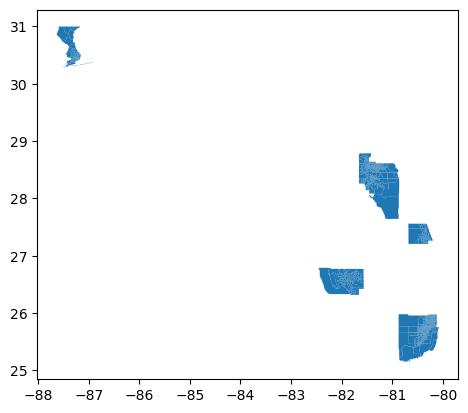

In [198]:
block_maps.plot()

## Clean block maps as needed

In [199]:
#Removing two small, no-vote strips of ORA county highway 
#And a large no-vote prec covering water off LEE county cost. 
#None of 3 in RDH results

block_maps = block_maps[~block_maps['pct_std'].isin(['ORA-0913', 'ORA-0917', 'LEE-0998'])]

# Assemble full map

## Set VEST as base

In [200]:
#Set draft file equal to VEST at baseline
draft = vest

## Set lists for source choices

***Note: As referenced earlier, two different versions of volunteer file are used.***

*Original version includes many shapes with duplicated precinct IDs.* <br>
*New, revised version does not. Shapes with duplicated IDs were dissolved together.*

*However, RDH staff mostly uses old version because many of the shapes w/ duplicated IDs should be removed, rather than dissolved.* <br>
*RDH staff determined this through visual inspection.*

*New version used only for counties where revisions improved map accuracy.*

In [201]:
#Set list of counties w/ alt sources or need edits to VEST
use_state = ['CHA','CLL','MRN','CLA','SUM','BRE','NAS','FLA', 'HIL', 'PAL', 'CIT', 'GLA', 'ALA']
use_vol = ['IND','LAK','POL','PUT','SAR','STJ','CLM','MAN', 'HEN', 'DUV','BRO','VOL', 'LEO', 'HER', 'PAS', 'BAY']
use_vol_new = ['SEM', 'PIN']
use_block = ['DAD', 'OSC', 'LEE', 'STL', 'ESC', 'ORA']

#List made to drop alt sources from VEST base map
drops = [use_state, use_vol, use_vol_new, use_block]

In [202]:
#Flatten the drops list
all_drops = list(chain(*drops))

#Drop alt source counties from those base map
draft = draft[~draft['county'].isin(all_drops)]

In [203]:
draft.head()

,county,PRECINCT,pct_std,G20PRERTRU,G20PREDBID,G20PRELJOR,G20PREODEL,G20PRESLAR,G20PREGHAW,G20PRECBLA,G20PREOWRI,geometry
39,BRA,1,BRA-0001,1258,128,9,0,0,1,0,1,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
40,BRA,2,BRA-0002,303,298,3,1,0,2,1,1,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
41,BRA,4,BRA-0004,929,177,8,0,0,0,0,1,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
42,BRA,6,BRA-0006,599,72,3,0,0,0,1,0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
43,BRA,7,BRA-0007,385,474,8,2,0,1,2,3,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."


## State file cleaning

### General

In [204]:
#Subset counties we want from state_gis file
state_sub = state_gis[(state_gis['CNTY_CODE'].isin(use_state))]

In [205]:
#Move county column to be first
cnty_column = state_sub.pop('CNTY_CODE')
state_sub.insert(0, 'CNTY_CODE', cnty_column)

In [206]:
#Make a clean precinct ID column to assign ID's matching RDH file
state_sub['clean_pct_id'] = state_sub['Precinct']
ss = state_sub

### Specific counties

#### Batch clean (CLA, NAS, FLA, HIL, CIT, PAL, GLA)

In [207]:
batch = ss[ss.CNTY_CODE.isin(['CLA', 'NAS', 'FLA', 'HIL', 'CIT', 'PAL'])]

batch['clean_pct'] = batch.CNTY_CODE + "-" + batch['PRECINCT'].str.zfill(4)
batch = batch.dissolve(by='clean_pct', as_index=False)

batch

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,clean_pct,geometry,CNTY_CODE,OBJECTID,GEOID20,GEOID_Spli,Precinct,Commission,Congress,CityNum,...,SENATEDIST,HOUSEDIST,BOCCDIST,COMMISSION,SCLBOARD,SHAPE_area,SHAPE_len,PG_Precinc_y,COUNTYFP20,clean_pct_id
0,CIT-0100,"POLYGON Z ((-82.57377 28.96227 0.00000, -82.57...",CIT,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
1,CIT-0101,"POLYGON Z ((-82.51792 28.94993 0.00000, -82.51...",CIT,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
2,CIT-0102,"POLYGON Z ((-82.41020 29.00742 0.00000, -82.41...",CIT,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
3,CIT-0103,"POLYGON Z ((-82.44354 28.99799 0.00000, -82.44...",CIT,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
4,CIT-0104,"POLYGON Z ((-82.54283 28.91328 0.00000, -82.54...",CIT,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1355,PAL-9434,"POLYGON ((-80.22356 26.60666, -80.22119 26.606...",PAL,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
1356,PAL-9435,"POLYGON ((-80.37626 26.78044, -80.37610 26.780...",PAL,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
1357,PAL-9436,"POLYGON ((-80.30237 26.68352, -80.30237 26.683...",PAL,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None
1358,PAL-9437,"POLYGON ((-80.20898 26.60208, -80.20895 26.600...",PAL,NaN,None,None,None,NaN,NaN,NaN,...,None,None,None,None,None,NaN,NaN,None,None,None


#### CLL

In [208]:
ss = state_sub
cll = ss[ss.CNTY_CODE == 'CLL']
cll['clean_pct'] = cll.CNTY_CODE + "-" + cll.PRECINCT + "0"

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


#### MRN

In [209]:
mrn = ss[ss.CNTY_CODE == 'MRN']
mrn['clean_pct'] = mrn.CNTY_CODE + "-" + mrn['NAME']

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


#### SUM

In [210]:
sum = ss[ss.CNTY_CODE == 'SUM']
sum['clean_pct'] = sum.CNTY_CODE + "-" + sum['PRECINCTID'].str.zfill(4)

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


#### BRE

In [211]:
bre = ss[ss.CNTY_CODE == 'BRE']
bre = bre.dissolve(by='New_Pct', as_index=False)
bre['New_Pct'] = bre['New_Pct'].astype(str).str.replace("\.0","",regex=True)
bre['clean_pct'] = bre.CNTY_CODE + "-" + bre['New_Pct'].str.zfill(4)

<>:3: SyntaxWarning: invalid escape sequence '\.'
<>:3: SyntaxWarning: invalid escape sequence '\.'
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/707101422.py:3: SyntaxWarning: invalid escape sequence '\.'
  bre['New_Pct'] = bre['New_Pct'].astype(str).str.replace("\.0","",regex=True)


#### GLA

In [212]:
#Minor cleaning
gla = ss[ss.CNTY_CODE == 'GLA']
gla['PRECINCT']  = gla['PRECINCT'].astype(str).str.zfill(4)
gla['clean_pct'] = gla.CNTY_CODE + '-' + gla.PRECINCT

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


#### CHA

In [213]:
cha = ss[ss.CNTY_CODE == 'CHA']
cha = cha.dissolve(by='UNIQUE_ID', as_index=False)
cha['clean_pct'] = cha.UNIQUE_ID

#### ALA

In [214]:
#Make pct_std column
ala['clean_pct'] = 'ALA-' + ala.Name.astype(str).str.zfill(4)

### Make a clean state gdf

In [215]:
#Make list of GDFs
state_clean_gdfs = [cll,mrn,sum,bre,cha,batch,ala,gla]

#Define the columns to keep
state_cols = ['clean_pct', 'CNTY_CODE', 'geometry']

#Initialize an empty GDF
state_clean = gpd.GeoDataFrame(columns=state_cols, geometry="geometry")

#Iterate through the list of GeoDataFrames and merge them into the combined GDF
state_clean = pd.concat([gdf[state_cols] for gdf in state_clean_gdfs], ignore_index=True)

#Set a pct_std col
state_clean['pct_std'] = state_clean.clean_pct

## Volunteer cleaning

In [216]:
#Subset counties we want from each version of volunteer file
vol_sub = volunteer[(volunteer['CNTY_CODE'].isin(use_vol))]

vol_sub_new = volunteer_revised[(volunteer_revised['CNTY_CODE'].isin(use_vol_new))]

vol_sub = gpd.GeoDataFrame(pd.concat([vol_sub, vol_sub_new], ignore_index=True), geometry='geometry')

#Clean pct_std column in VOL to match RDH style
vol_sub['pct_std'] = vol_sub['pct_std'].str[:3] + '-' + vol_sub['pct_std'].str[3:]

vol_sub.columns.unique()

Index(['pct_std', 'geometry', 'CNTY_CODE'], dtype='object')

### MAN

In [217]:
##Drop shapes in vol file that are small slivers
vol_sub = vol_sub[~vol_sub['pct_std'].isin(['MAN-0527'])]

### VOL (Volusia)

In [218]:
##Drop shapes in vol file that are small slivers
volusia_drops = vol_sub.loc[(vol_sub['CNTY_CODE'] == 'VOL') & (vol_sub['pct_std'].str.contains('[ABCD]')), 'pct_std'].tolist()
vol_sub = vol_sub[~vol_sub['pct_std'].isin(volusia_drops)]

In [219]:
volusia_drops

['VOL-101A',
 'VOL-102A',
 'VOL-103A',
 'VOL-103B',
 'VOL-503A',
 'VOL-503B',
 'VOL-504B',
 'VOL-514A',
 'VOL-501A',
 'VOL-504A',
 'VOL-502A',
 'VOL-902D',
 'VOL-418B',
 'VOL-905A',
 'VOL-104A',
 'VOL-201A',
 'VOL-214A',
 'VOL-215A',
 'VOL-309A',
 'VOL-418A',
 'VOL-719A',
 'VOL-801A',
 'VOL-808A',
 'VOL-512A',
 'VOL-906A',
 'VOL-415A',
 'VOL-810A',
 'VOL-311A']

### BAY

In [220]:
#Drop shapes in volunteer file that are small slivers
vol_sub = vol_sub[~((vol_sub['pct_std'] == 'BAY-0044') | (vol_sub['pct_std'] == 'BAY-0039'))]

### BRO

In [221]:
bro_map_csv = pd.read_csv('./raw-from-source/dictionaries/bro_map_dict.csv')
bro_map_dict = dict(zip(bro_map_csv['vol_label'], bro_map_csv['UNIQUE_ID']))

In [222]:
vol_sub['pct_std'] = vol_sub['pct_std'].replace(bro_map_dict)

In [223]:
#Drop shapes in volunteer file that are small slivers w/ no match in RDH results
bro_drop = ['BRO-F011','BRO-F012','BRO-Q044','BRO-V058','BRO-W020','BRO-W021','BRO-W025','BRO-Y006','BRO-Y007']
vol_sub = vol_sub[~vol_sub['pct_std'].isin(bro_drop)]

In [224]:
#Check out results
vol_sub[vol_sub.CNTY_CODE == 'BRO'].head()

,pct_std,geometry,CNTY_CODE
0,BRO-0040,"POLYGON Z ((-80.16596 26.25091 0.00000, -80.16...",BRO
1,BRO-0074,"POLYGON Z ((-80.17464 26.28059 0.00000, -80.17...",BRO
2,BRO-0316,"POLYGON Z ((-80.42375 25.95695 0.00000, -80.43...",BRO
3,BRO-0033,"POLYGON Z ((-80.13288 26.26060 0.00000, -80.13...",BRO
4,BRO-0036,"POLYGON Z ((-80.15592 26.21071 0.00000, -80.15...",BRO


### LEO

In [225]:
leo_map_csv = pd.read_csv('./raw-from-source/dictionaries/leo_map_dict.csv')
leo_map_dict = dict(zip(leo_map_csv['vol_ID'], leo_map_csv['UNIQUE_ID']))

In [226]:
vol_sub['pct_std'] = vol_sub['pct_std'].replace(leo_map_dict)

In [227]:
#Drop shapes in vol file that are small slivers
#Note, small slivers incl: LEO-2251, LEO-5265
#Note, actual shapes incl: LEO-1213, LEO-3402, LEO-5230. But they don't appear in RDH file

vol_sub = vol_sub[~vol_sub['pct_std'].isin(['LEO-2251','LEO-5265'])]

In [228]:
#Check out results
vol_sub[vol_sub.CNTY_CODE == 'LEO'].head()

,pct_std,geometry,CNTY_CODE
647,LEO-0132,"POLYGON Z ((-84.21005 30.41146 0.00000, -84.20...",LEO
648,LEO-0111,"POLYGON Z ((-84.12550 30.47809 0.00000, -84.12...",LEO
649,LEO-0091,"POLYGON Z ((-84.15521 30.67950 0.00000, -84.15...",LEO
650,LEO-0134,"POLYGON Z ((-84.04107 30.47813 0.00000, -84.04...",LEO
651,LEO-0092,"POLYGON Z ((-84.04279 30.57207 0.00000, -84.04...",LEO


### HER

In [229]:
her_map_csv = pd.read_csv('./raw-from-source/dictionaries/her_map_dict.csv')
her_map_dict = dict(zip(her_map_csv['vol_ID'], her_map_csv['UNIQUE_ID']))

In [230]:
vol_sub['pct_std'] = vol_sub['pct_std'].replace(her_map_dict)

In [231]:
#Check out results
vol_sub[vol_sub.CNTY_CODE == 'HER'].head()

,pct_std,geometry,CNTY_CODE
356,HER-0043,"POLYGON Z ((-82.51879 28.43372 0.00000, -82.51...",HER
357,HER-0027,"POLYGON Z ((-82.64666 28.52850 0.00000, -82.64...",HER
358,HER-0015,"POLYGON Z ((-82.67186 28.43607 0.00000, -82.67...",HER
359,HER-0049,"POLYGON Z ((-82.48868 28.49197 0.00000, -82.48...",HER
360,HER-0013,"POLYGON Z ((-82.53301 28.46085 0.00000, -82.52...",HER


### Drop or dissolve duplicates

In [232]:
#Make DF for duplicates
duplicate_rows = vol_sub[vol_sub.duplicated(subset='pct_std', keep=False)]

#Drop ALL duplicates from volunteer file dataframe
temp_merge = vol_sub.merge(duplicate_rows[['pct_std']], on='pct_std', how='left', indicator=True)
filtered_vol_sub = temp_merge[temp_merge['_merge'] == 'left_only'].drop(columns=['_merge'])

#Preview df
filtered_vol_sub.head()

,pct_std,geometry,CNTY_CODE
0,BRO-0040,"POLYGON Z ((-80.16596 26.25091 0.00000, -80.16...",BRO
1,BRO-0074,"POLYGON Z ((-80.17464 26.28059 0.00000, -80.17...",BRO
2,BRO-0316,"POLYGON Z ((-80.42375 25.95695 0.00000, -80.43...",BRO
3,BRO-0033,"POLYGON Z ((-80.13288 26.26060 0.00000, -80.13...",BRO
4,BRO-0036,"POLYGON Z ((-80.15592 26.21071 0.00000, -80.15...",BRO


In [233]:
#Add new col for inspecting first and second instance of duplicate
duplicate_rows['check_pct'] = np.where(duplicate_rows.duplicated(subset='pct_std'), duplicate_rows['pct_std'] + '-b', duplicate_rows['pct_std'] + '-a')

#Move the column to the first position
column_to_move = 'check_pct'
duplicate_rows.insert(0, column_to_move, duplicate_rows.pop(column_to_move))

duplicate_rows.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 146 entries, 9 to 1687
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   check_pct  146 non-null    object  
 1   pct_std    146 non-null    object  
 2   geometry   146 non-null    geometry
 3   CNTY_CODE  146 non-null    object  
dtypes: geometry(1), object(3)
memory usage: 5.7+ KB


/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Visually inspected duplicates to see if they should be dissolved together, kept or deleted.

In [234]:
#Make a list of duplicates that should be dropped. Then drop them.
drop_duplicates = ["BAY-0001-b","BAY-0002-b","BAY-0003-b","BAY-0007-b","BRO-0001-b","BRO-0005-b","BRO-0007-b","BRO-0008-b","BRO-0010-b","BRO-0011-b","BRO-0013-b","BRO-0016-b","BRO-0165-b","BRO-0168-b","BRO-0169-b","BRO-0179-b","BRO-0180-b","BRO-0223-b","BRO-0224-b","BRO-0225-b","BRO-0298-b","BRO-0347-b","BRO-0350-b","CLM-0015-a","CLM-0016-a","CLM-0017-a","CLM-0021-a","CLM-0022-a","CLM-0023-a","CLM-0031-a","CLM-0041-a","CLM-0042-a","DUV-1204-b","HEN-0002-b","HEN-0003-b","HEN-0007-b","HEN-0009-b","HER-0015-b","HER-0023-b","HER-0027-b","HER-0051-b","HER-0053-b","HER-0060-b","HER-0062-b","HER-0064-b","LEO-0005-b","LEO-0028-b","LEO-0037-b","LEO-0038-b","LEO-0041-b","LEO-0067-b","LEO-0068-b","LEO-0070-b","LEO-0088-b","LEO-0092-b","LEO-0111-b","LEO-0132-b","LEO-0134-b"]
duplicate_rows = duplicate_rows[~duplicate_rows['pct_std'].isin(drop_duplicates)]

#Change the pct_std of any duplicates that should be part of another precinct.
duplicate_rows.loc[duplicate_rows['check_pct'] == 'POL-0537-b', 'pct_std'] = 'POL-0539'
duplicate_rows.loc[duplicate_rows['check_pct'] == 'BRO-0301-b', 'pct_std'] = 'BRO-0302'
duplicate_rows.loc[duplicate_rows['check_pct'] == 'BRO-0309-b', 'pct_std'] = 'BRO-0305'
duplicate_rows.loc[duplicate_rows['check_pct'] == 'BRO-0313-b', 'pct_std'] = 'BRO-0314'
duplicate_rows.loc[duplicate_rows['check_pct'] == 'BRO-0314-b', 'pct_std'] = 'BRO-0313'
duplicate_rows.loc[duplicate_rows['check_pct'] == 'BRO-0312-b', 'pct_std'] = 'BRO-0316'
duplicate_rows.loc[duplicate_rows['check_pct'] == 'BRO-0313-b', 'pct_std'] = 'BRO-0312'

#Dissolve remaining duplicates together.
duplicate_rows = duplicate_rows.dissolve(by='pct_std').reset_index()

In [235]:
#Add these duplicates back to the other DF.
vol_sub = gpd.GeoDataFrame(pd.concat([duplicate_rows, filtered_vol_sub], ignore_index=True), geometry='geometry')

#Remove check_pct col
vol_sub = vol_sub.drop(columns='check_pct')

#Dissolve remaining precs (i.e. ones that needed to be re-identified as part of other precs)
vol_sub = vol_sub.dissolve(by='pct_std').reset_index()

## VEST cleaning

In [236]:
#VEST precinct ID on the left, RDH precinct ID on the right
#See README for note on identifying correct prec IDs.

vest_mapping = {
    #MAD county
    'MAD-0005': 'MAD-0003',
    'MAD-0003': 'MAD-0005',
    'MAD-0006': 'MAD-0008',
    'MAD-0007': 'MAD-0009',
    'MAD-0008': 'MAD-0010',
    'MAD-0009': 'MAD-0011',
    'MAD-0010': 'MAD-0012',
    'MAD-0011': 'MAD-0013',
    #OKE county
    'OKE-0007': 'OKE-0009',
    'OKE-0008': 'OKE-0010',
    'OKE-0009': 'OKE-0011',
    'OKE-0010': 'OKE-0012',
    'OKE-0011': 'OKE-0013',
    #CAL county
    'CAL-0101': 'CAL-0001',
    'CAL-0102': 'CAL-0002',
    'CAL-0201': 'CAL-0003',
    'CAL-0202': 'CAL-0004',
    'CAL-0301': 'CAL-0005',
    'CAL-0302': 'CAL-0006',
    'CAL-0401': 'CAL-0007',
    'CAL-0402': 'CAL-0008',
    'CAL-0501': 'CAL-0009',
    'CAL-0502': 'CAL-0010',
    'CAL-0503': 'CAL-0011',
    #UNI
    'UNI-003C': 'UNI-003C',
    'UNI-004B': 'UNI-004B',
    'UNI-005B': 'UNI-005B',
    'UNI-1A1B': 'UNI-1A & 1B',
    'UNI-2A2B': 'UNI-2A & 2B',
    'UNI-3A3B': 'UNI-3A & 3B',
    'UNI-4A4C': 'UNI-4A & 4C',
    'UNI-5A5C': 'UNI-5A & 5C',
    #WAS
    'WAS-0011': 'WAS-0001-Ebro Town Hall',
    'WAS-0012': 'WAS-0001-Greenhead',
    'WAS-0015': 'WAS-0001-Sunny Hills',
    'WAS-0008': 'WAS-Armory - Chipley',
    'WAS-0001': 'WAS-Caryville',
    'WAS-0004': 'WAS-First Baptist Church - Chipley',
    'WAS-0002': 'WAS-Five Points',
    'WAS-0003': 'WAS-Hinson Crossroads',
    'WAS-0006': 'WAS-New Hope - Campbells Park',
    'WAS-0007': 'WAS-Orange Hill Fire Station',
    'WAS-0005': 'WAS-Vernon City Hall',
    'WAS-0009': 'WAS-Wausau'}

draft['pct_std'] = draft['pct_std'].replace(vest_mapping)

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


## Geospatial edits

### Fixing one overlap in LEE

Spotted during visual comparison with L2 voter file.

<Axes: >

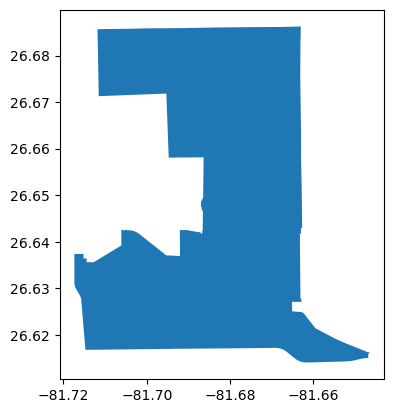

In [237]:
#Select the geometries for LEE-0501 and LEE-0502
lee0501_geometry = block_maps.loc[block_maps['pct_std'] == 'LEE-0501', 'geometry']
lee0502_geometry = block_maps.loc[block_maps['pct_std'] == 'LEE-0502', 'geometry']

#Reset the indices of the GeoSeries to avoid error message
lee0501_geometry = lee0501_geometry.reset_index(drop=True)
lee0502_geometry = lee0502_geometry.reset_index(drop=True)

#Calculate the difference to remove the overlapping area
new_lee0501_geometry = lee0501_geometry.difference(lee0502_geometry)

#Update the GeoDataFrame with the modified geometry
block_maps.loc[block_maps['pct_std'] == 'LEE-0501', 'geometry'] = new_lee0501_geometry.geometry.iloc[0]

#Plot the updated GeoDataFrame
block_maps[block_maps.pct_std=='LEE-0501'].plot()

##  Allocate/aggregate votes as needed

Some precincts in election results could not be matched to specific shapes.

In those cases, RDH allocates those votes to (a) the whole county or (b) precincts with shapes that likely contain those votes.

### Define allocator function

In [238]:
def allocate_absentee(df_receiving_votes,df_allocating,column_list,col_allocating,allocating_to_all_empty_precs=False):
    """Allocates votes proportionally to precincts, usually by share of precinct-reported vote

    Args:
      df_receiving_votes: DataFrame with precinct-level votes
      df_allocating: DataFrame with the votes to allocate
      column_list: List of races that votes are being allocated for
      col_allocating: String referring to what level the allocation occurs at (most often county)
      allocating_to_all_empty_precs: Boolean for special case where all votes in df_receiving_votes are 0

    Returns:
      The precinct-level votes dataframe (df_receiving_votes) with the allocated votes
    """

    #Fill any n/a values with 0
    df_receiving_votes = df_receiving_votes.fillna(0)
    #Grab the original columns, so we can filter back down to them later
    original_cols = list(df_receiving_votes.columns)

    #Add in the "Total Votes column"
    if (allocating_to_all_empty_precs):
        #In cases where every vote is 0, need to set the Total_Votes equal to 1 for proportional allocation
        df_receiving_votes.loc[:,"Total_Votes"]=1
    else:
        df_receiving_votes.loc[:,"Total_Votes"]=0
        for race in column_list:
            df_receiving_votes.loc[:,"Total_Votes"]+=df_receiving_votes.loc[:,race]

    #Create the needed dataframes
    precinct_specific_totals = pd.DataFrame(df_receiving_votes.groupby([col_allocating]).sum())
    precinct_specific_totals.reset_index(drop=False,inplace=True)
    to_dole_out_totals = pd.DataFrame(df_allocating.groupby([col_allocating]).sum())
    to_dole_out_totals.reset_index(drop=False,inplace=True)

    #Add in total sum check
    sum_dataframe = pd.DataFrame(columns=precinct_specific_totals.columns)
    for i in column_list:
        total_votes = precinct_specific_totals.loc[:,i].sum()+to_dole_out_totals.loc[:,i].sum()
        sum_dataframe.at[0,i]=total_votes.astype(int)

    #Check the allocating to empty precincts code
    if (allocating_to_all_empty_precs):
        for i in column_list:
            if(sum(precinct_specific_totals[i])!=0):
                print("Allocating to all empty precincts parameter incorrect")
                break

    #Print out any instances where the allocation, as written, won't work
    special_allocation_needed = []
    for index, row in precinct_specific_totals.iterrows():
        for race in column_list:
            if (row[race]==0):
                race_district = row[col_allocating]
                if race_district in to_dole_out_totals[col_allocating].unique():
                    to_allocate = int(to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==race_district][race])
                    if (to_allocate != 0):
                        special_allocation_needed.append([race_district,race])
                        if(row["Total_Votes"]==0):
                            precinct_specific_totals.loc[index,"Total_Votes"]=1
                            col_val = row[col_allocating]
                            df_receiving_votes.loc[df_receiving_votes[col_allocating]==col_val,"Total_Votes"]=1

    #Create some new columns for each of these races to deal with the allocation
    for race in column_list:
        add_var = race+"_add"
        rem_var = race+"_rem"
        floor_var = race+"_floor"
        df_receiving_votes.loc[:,add_var]=0.0
        df_receiving_votes.loc[:,rem_var]=0.0
        df_receiving_votes.loc[:,floor_var]=0.0

    #Iterate over the rows
    #Note this function iterates over the dataframe two times so the rounded vote totals match the totals to allocate
    for index, row in tqdm(df_receiving_votes.iterrows(), total=len(df_receiving_votes), desc="Processing", ncols=100):
        if row[col_allocating] in to_dole_out_totals[col_allocating].unique():
            for race in column_list:
                add_var = race+"_add"
                rem_var = race+"_rem"
                floor_var = race+"_floor"
                #Grab the district
                county_id = row[col_allocating]
                if [county_id,race] in special_allocation_needed:
                    #Get the denominator for the allocation - the summed "total votes" for precincts in that grouping
                    denom = precinct_specific_totals.loc[precinct_specific_totals[col_allocating]==county_id]["Total_Votes"]
                    #Get one of the numerators, how many districtwide votes to allocate
                    numer = to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==county_id][race]
                    #Get the "total votes" for this particular precinct
                    val = df_receiving_votes.at[index,"Total_Votes"]
                    #Get the vote share, the precincts % of total precinct votes in the district times votes to allocate
                else:
                    #Get the denominator for the allocation (the precinct vote totals)
                    denom = precinct_specific_totals.loc[precinct_specific_totals[col_allocating]==county_id][race]
                    #Get one of the numerators, how many districtwide votes to allocate
                    numer = to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==county_id][race]
                    #Get the vote totals for this race in this precinct
                    val = df_receiving_votes.at[index,race]
                    #Get the vote share, the precincts % of total precinct votes in the district times votes to allocate
                if ((float(denom)==0)):
                    vote_share = 0
                else:
                    vote_share = (float(val)/float(denom))*float(numer)
                df_receiving_votes.at[index,add_var] = vote_share
                #Take the decimal remainder of the allocation
                df_receiving_votes.at[index,rem_var] = vote_share%1
                #Take the floor of the allocation
                df_receiving_votes.at[index,floor_var] = np.floor(vote_share)

    #After the first pass through, get the sums of the races by district to assist in the rounding
    first_allocation = pd.DataFrame(df_receiving_votes.groupby([col_allocating]).sum())

    #Now we want to iterate district by district to work on rounding
    county_list = list(to_dole_out_totals[col_allocating].unique())

    #Iterate over the district
    for county in county_list:
        for race in column_list:
            add_var = race+"_add"
            rem_var = race+"_rem"
            floor_var = race+"_floor"
            #County how many votes still need to be allocated (because we took the floor of all the initial allocations)
            to_go = int(np.round((int(to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==county][race])-first_allocation.loc[first_allocation.index==county,floor_var])))
            #Grab the n precincts with the highest remainders and round these up, where n is the # of votes that still need to be allocated
            for index in df_receiving_votes.loc[df_receiving_votes[col_allocating]==county][rem_var].nlargest(to_go).index:
                df_receiving_votes.at[index,add_var] = np.ceil(df_receiving_votes.at[index,add_var])

    #Iterate over every race again
    for race in column_list:
        add_var = race+"_add"
        #Round every allocation down to not add fractional votes
        df_receiving_votes.loc[:,add_var]=np.floor(df_receiving_votes.loc[:,add_var])
        df_receiving_votes.loc[:,race]+=df_receiving_votes.loc[:,add_var]
        df_receiving_votes.loc[:,race] = df_receiving_votes.loc[:,race].astype(int)
        #Check to make sure all the votes have been allocated
        if ((sum_dataframe.loc[:,race].sum()-df_receiving_votes.loc[:,race].sum()!=0)):
            print("Some issue in allocating votes for:", i)

    #Filter down to original columns
    df_receiving_votes = df_receiving_votes[original_cols]

    return df_receiving_votes

### DAD

In [239]:
elec_cols = [col for col in rdh.columns if col.startswith('G')]

# Agg DAD-4471 to 4470
indices_4471 = rdh.index[rdh['UNIQUE_ID'] == 'DAD-4471']
indices_4470 = rdh.index[rdh['UNIQUE_ID'] == 'DAD-4470']
if indices_4471.any() and indices_4470.any():
    rdh.loc[indices_4470[0], elec_cols] += rdh.loc[indices_4471[0], elec_cols]

# Agg DAD-4481 to 4480
indices_4481 = rdh.index[rdh['UNIQUE_ID'] == 'DAD-4481']
indices_4480 = rdh.index[rdh['UNIQUE_ID'] == 'DAD-4480']
if indices_4481.any() and indices_4480.any():
    rdh.loc[indices_4480[0], elec_cols] += rdh.loc[indices_4481[0], elec_cols]

# Agg DAD-9571 to 9570
indices_9571 = rdh.index[rdh['UNIQUE_ID'] == 'DAD-9571']
indices_9570 = rdh.index[rdh['UNIQUE_ID'] == 'DAD-9570']
if indices_9571.any() and indices_9570.any():
    rdh.loc[indices_9570[0], elec_cols] += rdh.loc[indices_9571[0], elec_cols]

# Drop allocated precs
drop_precs = ['DAD-4471', 'DAD-4481', 'DAD-9571']
rdh = rdh[~rdh['UNIQUE_ID'].isin(drop_precs)]

In [240]:
rdh[rdh['UNIQUE_ID']=='DAD-4470']

,UNIQUE_ID,COUNTYFP,CNTY_CODE,CNTY_NAME,PREC_ID,POLL_LOC,G22A1NO,G22A1YES,G22A2NO,G22A2YES,...,GSU27DPRO,GSU27RALB,GSU30DPOL,GSU30RREI,GSU33OWRI,GSU33RMAR,GSU36DPAC,GSU36RGAR,GSU38DPER,GSU38RCAL
1372,DAD-4470,86,DAD,Miami-Dade,4470,PRECINCT 447.0,507,762,601,640,...,0,0,0,0,0,0,473,881,0,0


### PAL

In [241]:
#Allocate to whole county:
#PAL-9902

#Set up vars/DFs for allocate function

#Set receiving votes DF to include all PAL precs except 9901 and 9902
#9901 is a no-vote prec and therefore should receive no votes
pal_rec = rdh[(rdh['CNTY_CODE'] == 'PAL') & (~rdh['UNIQUE_ID'].isin(['PAL-9901', 'PAL-9902']))]

#Set allocating votes DF to only include 9902
pal_alloc = rdh[rdh.UNIQUE_ID == 'PAL-9902']

#Contest cols
column_list = [col for col in rdh.columns if col.startswith('G')]

#Allocating to county level
col_allocating = 'CNTY_CODE'

#Special case boolean set to false
allocating_to_all_empty_precs = False

In [242]:
#Run func
pal_rec = allocate_absentee(pal_rec,pal_alloc,column_list,col_allocating,allocating_to_all_empty_precs=False)

/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/721183986.py:69: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_receiving_votes.loc[:,rem_var]=0.0
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/721183986.py:70: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_receiving_votes.loc[:,floor_var]=0.0
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/721183986.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, 

### SEM

In [243]:
#Set up vars/DFs for allocate function
sem_alloc_list = ['SEM-1001','SEM-1002','SEM-1003','SEM-1004','SEM-1005','SEM-1006','SEM-1007','SEM-1008','SEM-2001','SEM-2002','SEM-2003']

#Set receiving votes DF to include all SEM precs except ones from list
sem_rec = rdh[(rdh['CNTY_CODE'] == 'SEM') & (~rdh['UNIQUE_ID'].isin(sem_alloc_list))]

#Set allocating votes DF to only include ones from list
sem_alloc = rdh[rdh.UNIQUE_ID.isin(sem_alloc_list)]

In [244]:
#Run func
sem_rec = allocate_absentee(sem_rec,sem_alloc,column_list,col_allocating,allocating_to_all_empty_precs=False)

/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/721183986.py:69: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_receiving_votes.loc[:,rem_var]=0.0
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/721183986.py:70: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_receiving_votes.loc[:,floor_var]=0.0
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/721183986.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, 

### Incorporate allocations into file

In [245]:
rdh = rdh[~rdh['CNTY_CODE'].isin(['SEM','PAL'])]

rdh = pd.concat([rdh, sem_rec, pal_rec], ignore_index=True)

## Merge all boundaries into single GDF

In [246]:
#GDFs: draft, vol_sub, state_clean, block_maps

#Make a common column
draft['CNTY_CODE'] = draft.county

#Set lists of GDFs and cols we want
assembly_gdfs = [draft, vol_sub, state_clean, block_maps]
simple_cols = ['pct_std', 'geometry']

#Set common CRS
for i in assembly_gdfs:
  i.to_crs(vest.crs,inplace=True)
  print(i.crs)

#Extract and concatenate the specified columns from the GeoDataFrames
draft = gpd.GeoDataFrame(pd.concat([gdf[simple_cols] for gdf in assembly_gdfs], ignore_index=True), geometry='geometry')

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


EPSG:4269
EPSG:4269
EPSG:4269
EPSG:4269


In [247]:
vol_sub

,pct_std,geometry,CNTY_CODE
0,BAY-0001,"MULTIPOLYGON Z (((-85.48787 30.43945 0.00000, ...",BAY
1,BAY-0002,"MULTIPOLYGON Z (((-85.58705 30.32327 0.00000, ...",BAY
2,BAY-0003,"MULTIPOLYGON Z (((-85.38973 30.22658 0.00000, ...",BAY
3,BAY-0004,"MULTIPOLYGON Z (((-85.55146 30.27647 0.00000, ...",BAY
4,BAY-0005,"POLYGON Z ((-85.55831 30.34925 0.00000, -85.55...",BAY
...,...,...,...
1955,VOL-0902,"MULTIPOLYGON Z (((-80.89153 28.96553 0.00000, ...",VOL
1956,VOL-0903,"POLYGON Z ((-80.88544 28.96278 0.00000, -80.88...",VOL
1957,VOL-0904,"MULTIPOLYGON Z (((-80.87620 28.94553 0.00000, ...",VOL
1958,VOL-0905,"MULTIPOLYGON Z (((-80.95886 28.80483 0.00000, ...",VOL


In [248]:
#Minor cleaning
draft = draft.rename(columns={'pct_std':'UNIQUE_ID'})

Drop any remaining no-vote, no-geography precincts

In [249]:
no_vote_drop = [
    'CHA-4101', 'CLM-0444', 'FLA-0999','PAL-9901', 'SEM-2001', 'SEM-2002',
    'DAD-1002', 'DAD-1003','DAD-1004','DAD-1005','DAD-4061']
rdh = rdh[~rdh['UNIQUE_ID'].isin(no_vote_drop)]

## Merge boundaries and election results

In [250]:
join = draft.merge(rdh, on='UNIQUE_ID',how='outer')

In [251]:
#Re-instantiate CNTY_CODE var to help later identify unmatched precs
join['CNTY_CODE'] = join.UNIQUE_ID.str[:3]

#Set county fips codes as strings with 3 characters
join['COUNTYFP'] = join.COUNTYFP.astype(str).str.replace('\.0','',regex=True).str.zfill(3)

#Fill other missing county info for unmatched precs
fips_fill_dict = {'MON':'087','PAL':'099','LEO':'073','PAS':'101','BRO':'011'}
name_fill_dict = {'MON':'Monroe','PAL':'Palm Beach','LEO':'Leon','PAS':'Pasco','BRO':'Broward'}

join['COUNTYFP'] = join['CNTY_CODE'].map(fips_fill_dict).fillna(join['COUNTYFP'])
join['CNTY_NAME'] = join['CNTY_CODE'].map(name_fill_dict).fillna(join['CNTY_NAME'])

#Fill nulls as zero
join.loc[:, join.columns.str.contains('G')] = join.loc[:, join.columns.str.contains('G')].fillna(0)

#Buffer to resolve invalid geometries
join['geometry']= join.geometry.buffer(0)

<>:5: SyntaxWarning: invalid escape sequence '\.'
<>:5: SyntaxWarning: invalid escape sequence '\.'
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/424603369.py:5: SyntaxWarning: invalid escape sequence '\.'
  join['COUNTYFP'] = join.COUNTYFP.astype(str).str.replace('\.0','',regex=True).str.zfill(3)


In [252]:
join.head()

,UNIQUE_ID,geometry,COUNTYFP,CNTY_CODE,CNTY_NAME,PREC_ID,POLL_LOC,G22A1NO,G22A1YES,G22A2NO,...,GSU27DPRO,GSU27RALB,GSU30DPOL,GSU30RREI,GSU33OWRI,GSU33RMAR,GSU36DPAC,GSU36RGAR,GSU38DPER,GSU38RCAL
0,BRA-0001,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11...",007,BRA,Bradford,1,Precinct 1,425.0,496.0,436.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,BRA-0002,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04...",007,BRA,Bradford,2,Precinct 2,160.0,204.0,146.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,BRA-0004,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16...",007,BRA,Bradford,4,Precinct 4,333.0,419.0,315.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,BRA-0006,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21...",007,BRA,Bradford,6,Precinct 6,222.0,238.0,210.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,BRA-0007,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04...",007,BRA,Bradford,7,Precinct 7,257.0,208.0,222.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: >

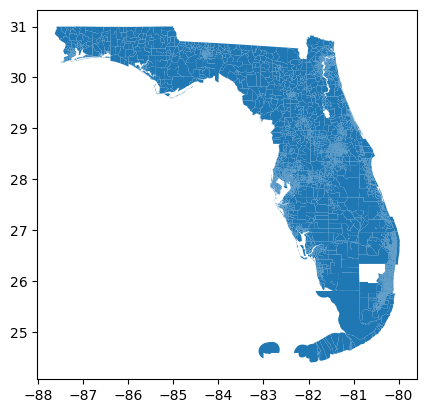

In [253]:
join.plot()

# Final checks for full PBER file

## Counts of precincts by counties

In [254]:
# Group by 'CNTY_CODE' and count unique 'UNIQUE_ID' per county
rdh_count = rdh.groupby('CNTY_CODE')['UNIQUE_ID'].nunique().reset_index()

# Rename the 'UNIQUE_ID' column
rdh_count.rename(columns={'UNIQUE_ID': 'rdh_count'}, inplace=True)

# Group by 'CNTY_CODE' and count unique 'UNIQUE_ID' per county
join_count = join.groupby('CNTY_CODE')['UNIQUE_ID'].nunique().reset_index()

# Rename the 'UNIQUE_ID' column
join_count.rename(columns={'UNIQUE_ID': 'join_count'}, inplace=True)

# Merge
rdh_v_join = pd.merge(rdh_count,join_count,on='CNTY_CODE')

#Preview data
pd.set_option('display.max_rows', 70)
unequal = rdh_v_join[rdh_v_join.rdh_count != rdh_v_join.join_count]

unequal

##Small differences in BRO, LEO, MON, PAL and PAS are expected.
##Map includes some no-vote precinct boundaries that were not part of election results file.

,CNTY_CODE,rdh_count,join_count
5,BRO,355,356
36,LEO,136,139
41,MON,33,34
49,PAL,793,794
50,PAS,120,121


In [255]:
#Add county col to join DF
join['CNTY_CODE'] = join.UNIQUE_ID.str[:3]

#Create list of counties
counties = rdh['CNTY_CODE'].unique().tolist()

# Initialize lists for each column
county_column = []
rdh_only_column = []
join_only_column = []

for county in counties:

    # Set the county value
    county_column.append(county)
    
    rdh_county = rdh[rdh['CNTY_CODE'] == county]
    join_county = join[join['CNTY_CODE'] == county]

    # Calculate 'rdh_only' for the current county
    rdh_only = [i for i in list(rdh_county.UNIQUE_ID) if i not in (list(join.UNIQUE_ID))]
    rdh_only_column.append(rdh_only)

    # Calculate 'join_only' for the current county
    join_only = [i for i in list(join_county.UNIQUE_ID) if i not in list(rdh_county.UNIQUE_ID)]
    join_only_column.append(join_only)

#Create the DataFrame
distinct_precs_check = pd.DataFrame({
    'CNTY_CODE': county_column,
    'rdh_only': rdh_only_column,
    'join_only': join_only_column
})

distinct_precs_check

,CNTY_CODE,rdh_only,join_only
0,ALA,[],[]
1,BAK,[],[]
2,BAY,[],[]
3,BRA,[],[]
4,BRE,[],[]
5,BRO,[],[BRO-0998]
6,CAL,[],[]
7,CHA,[],[]
8,CIT,[],[]
9,CLA,[],[]


## Duplicate values check

In [256]:
duplicate_check = join[join.duplicated(subset='UNIQUE_ID', keep=False)]

In [257]:
duplicate_check['NEW_UNIQUE_ID'] = np.where(duplicate_check.duplicated(subset='UNIQUE_ID'), duplicate_check['UNIQUE_ID'] + '-b', duplicate_check['UNIQUE_ID'] + '-a')

# Assuming 'NEW_UNIQUE_ID' is the name of the new column
column_to_move = 'NEW_UNIQUE_ID'

# Move the column to the first position
duplicate_check.insert(0, column_to_move, duplicate_check.pop(column_to_move))

duplicate_check['CNTY_CODE'].unique()

array([], dtype=object)

## Vote total comparisons

In [258]:
def compare_totals(df1, df2):
    for column in df1.columns:
        if column in df2.columns:
            try:
                total_df1 = pd.to_numeric(df1[column]).sum()
                total_df2 = pd.to_numeric(df2[column]).sum()
                difference = total_df1 - total_df2
                print(f"Column: {column}, Difference: {difference}")
            except ValueError as e:
                print(f"Error processing column {column}: {e}")

In [259]:
compare_totals(rdh,join)

Error processing column UNIQUE_ID: Unable to parse string "ALA-0001" at position 0
Column: COUNTYFP, Difference: -517
Error processing column CNTY_CODE: Unable to parse string "ALA" at position 0
Error processing column CNTY_NAME: Unable to parse string "Alachua" at position 0
Error processing column PREC_ID: Unable to parse string "1A" at position 64
Error processing column POLL_LOC: Unable to parse string "First Baptist Church of Waldo" at position 0
Column: G22A1NO, Difference: 0.0
Column: G22A1YES, Difference: 0.0
Column: G22A2NO, Difference: 0.0
Column: G22A2YES, Difference: 0.0
Column: G22A3NO, Difference: 0.0
Column: G22A3YES, Difference: 0.0
Column: G22ATGDAYA, Difference: 0.0
Column: G22ATGRMOO, Difference: 0.0
Column: G22CFODHAT, Difference: 0.0
Column: G22CFOOWRI, Difference: 0.0
Column: G22CFORPAT, Difference: 0.0
Column: G22COADBLE, Difference: 0.0
Column: G22COARSIM, Difference: 0.0
Column: G22GOVDCRI, Difference: 0.0
Column: G22GOVLROO, Difference: 0.0
Column: G22GOVNGIM

# Split maps

Code for maps that split precincts according to legislative district

## Statewide

In [260]:
pber = join

In [261]:
statewide = pber.loc[:, ~pber.columns.str.startswith(('GCON', 'GSL', 'GSU'))]

In [262]:
statewide.head()

,UNIQUE_ID,geometry,COUNTYFP,CNTY_CODE,CNTY_NAME,PREC_ID,POLL_LOC,G22A1NO,G22A1YES,G22A2NO,...,G22SCJYCOU,G22SCJYGRO,G22SCJYLAB,G22SCJYPOL,G22USSDDEM,G22USSLMIS,G22USSNGRA,G22USSNNGU,G22USSOWRI,G22USSRRUB
0,BRA-0001,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11...",007,BRA,Bradford,1,Precinct 1,425.0,496.0,436.0,...,573.0,575.0,429.0,504.0,106.0,0.0,4.0,2.0,1.0,979.0
1,BRA-0002,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04...",007,BRA,Bradford,2,Precinct 2,160.0,204.0,146.0,...,211.0,216.0,223.0,218.0,192.0,3.0,5.0,1.0,0.0,215.0
2,BRA-0004,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16...",007,BRA,Bradford,4,Precinct 4,333.0,419.0,315.0,...,459.0,465.0,363.0,433.0,122.0,1.0,2.0,1.0,0.0,724.0
3,BRA-0006,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21...",007,BRA,Bradford,6,Precinct 6,222.0,238.0,210.0,...,278.0,287.0,205.0,246.0,49.0,1.0,2.0,2.0,1.0,479.0
4,BRA-0007,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04...",007,BRA,Bradford,7,Precinct 7,257.0,208.0,222.0,...,247.0,250.0,271.0,249.0,257.0,1.0,3.0,1.0,0.0,243.0


## Congress

### Split

In [263]:
pber = join

In [264]:
#2022 FL congressional plan
cong = gp.read_file('./raw-from-source/fl_cong_adopted_2022/P000C0109.shp')
cong = cong.to_crs(pber.crs)

In [265]:
#Election gdf to be modified
pber["CONG_DIST"] = 0

pber_cong = pber[["UNIQUE_ID","CNTY_CODE","CNTY_NAME","CONG_DIST"]+list(pber.columns[(pber.columns.str.contains("GCON"))])+["geometry"]]

In [266]:
#Fill null as zero
pber_cong.loc[:, pber_cong.columns.str.contains('GCON')] = pber_cong.loc[:, pber_cong.columns.str.contains('GCON')].fillna(0)

In [267]:
def is_split_precinct(district_assignment_list):
    '''
    input: list of precincts and district assignments
    fxn: evaluate if precinct has one or more district assignments
    return: 0 if precinct:district is 1:1 assignment, or return assignment 
    '''
    c = Counter([x[0] for x in district_assignment_list])
    greater_than_one = {x:[y[1] for y in district_assignment_list if y[0]==x] for x, count in c.items() if count > 1}
    if len(greater_than_one)==0:
        return 0
    else:
        return greater_than_one
    
def get_level_dist(column_name):
    '''
    fxn to grab district and contest from column names
    '''
    if column_name[0:4] == "GSLP":
        level = "SL"
        dist = "004"
    elif column_name[0:3] == "GSL":
        level = "SL"
        dist = column_name[3:6]
    elif column_name[0:3] == "GCO":
        level = "CON"
        dist = column_name[4:6]
    else:
        print(column_name)
        raise ValueError
    return level,dist


def return_cd(row):
    for val in races:
        if row[val] != 0:
            return val[4:6]
        

races = [i for i in list(pber_cong.columns) if "GCON" in i]
precinct_mapping_dict = {}
split_precincts_list = {}
for index,row in pber_cong.iterrows():
    precinct_list = []
    for contest in races:
        if(row[contest]!=0):
            precinct_info = get_level_dist(contest)
            if precinct_info not in precinct_list:
                precinct_list.append(get_level_dist(contest))
    is_split = is_split_precinct(precinct_list)
    if (is_split):
        split_precincts_list[row["UNIQUE_ID"]]=is_split
    precinct_mapping_dict[row["UNIQUE_ID"]]=precinct_list
    

#Standardize district format with name different from PBER to use later and distinguish when splits occur
cong['HOUSE_DIST']=cong["DISTRICT"].astype(str).str.zfill(2)
pber_cong["CONG_DIST"] = pber_cong.apply(lambda row: return_cd(row), axis = 1)

split_precincts_list

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


{'LAF-0001': {'CON': ['02', '03']},
 'WAL-0330': {'CON': ['01', '02']},
 'WAL-0320': {'CON': ['01', '02']},
 'WAL-0310': {'CON': ['01', '02']},
 'WAL-0430': {'CON': ['01', '02']},
 'WAL-0230': {'CON': ['01', '02']},
 'WAL-0210': {'CON': ['01', '02']},
 'BRO-0208': {'CON': ['20', '23']},
 'BRO-0345': {'CON': ['20', '25']},
 'PAS-0001': {'CON': ['12', '15']},
 'CLL-1420': {'CON': ['19', '26']},
 'CLL-1560': {'CON': ['19', '26']},
 'CLL-3220': {'CON': ['19', '26']},
 'CLL-3230': {'CON': ['19', '26']},
 'CLL-3240': {'CON': ['19', '26']},
 'CLL-4280': {'CON': ['19', '26']},
 'CLL-4300': {'CON': ['19', '26']},
 'CLL-4350': {'CON': ['19', '26']},
 'CLL-4390': {'CON': ['19', '26']},
 'CLL-4400': {'CON': ['19', '26']},
 'CLL-5940': {'CON': ['18', '26']},
 'MRN-1090': {'CON': ['03', '06']},
 'HIL-0623': {'CON': ['14', '15']},
 'HIL-0912': {'CON': ['14', '16']},
 'LEE-0408': {'CON': ['17', '19']},
 'LEE-0417': {'CON': ['17', '19']},
 'LEE-0504': {'CON': ['17', '19']},
 'LEE-0506': {'CON': ['17', 

In [268]:
pd.set_option('display.max_rows', 999)

In [269]:
pber_cong['CONG_DIST'].unique()

array(['03', '02', '18', '01', '21', '28', None, '23', '20', '25', '24',
       '04', '12', '08', '11', '06', '16', '15', '14', '13', '09', '17',
       '07', '26', '19', '22', '27', '10'], dtype=object)

In [270]:
#Initialize new variable name to update in for loop
pber_w_splits = pber_cong.copy()
for val in pber_cong["UNIQUE_ID"]:
    cd_list = []
    if val in split_precincts_list.keys():
        print(val)
        pber_w_splits = district_splits_mod(split_precincts_list[val],"CONG",val, pber_w_splits, cong, "UNIQUE_ID", "HOUSE_DIST", races, "CONG_DIST")

LAF-0001
WAL-0330
WAL-0320
WAL-0310
WAL-0430
WAL-0230
WAL-0210
BRO-0208
BRO-0345
PAS-0001
CLL-1420
CLL-1560
CLL-3220
CLL-3230
CLL-3240
CLL-4280
CLL-4300
CLL-4350
CLL-4390
CLL-4400
CLL-5940
MRN-1090
HIL-0623
HIL-0912
LEE-0408
LEE-0417
LEE-0504
LEE-0506
LEE-0508
LEE-0510
LEE-0514


In [271]:
pber_w_splits[pber_w_splits['UNIQUE_ID'].str.contains("CONG")]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,CONG_DIST,GCON01DJON,GCON01RGAE,GCON02DLAW,GCON02RDUN,GCON03DHAW,GCON03NBRO,...,GCON25DSCH,GCON25RSPA,GCON26DOLI,GCON26RDIA,GCON27DTAD,GCON27RSAL,GCON28DASE,GCON28OWRI,GCON28RGIM,geometry
5965,LAF-0001-(CONG-02),LAF,Lafayette,02,0.0,0.0,10.0,115.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-83.36887 30.15355 0.00000, -83.36..."
5966,LAF-0001-(CONG-03),LAF,Lafayette,03,0.0,0.0,0.0,0.0,31.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-83.26651 30.26026 0.00000, -83.26..."
5967,WAL-0330-(CONG-01),WAL,Walton,01,65.0,460.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-86.12279 30.67666 0.00000, ..."
5968,WAL-0330-(CONG-02),WAL,Walton,02,0.0,0.0,61.0,260.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.15746 30.73562 0.00000, -86.15..."
5969,WAL-0320-(CONG-01),WAL,Walton,01,46.0,269.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.17716 30.61476 0.00000, -86.17..."
5970,WAL-0320-(CONG-02),WAL,Walton,02,0.0,0.0,217.0,605.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-86.12278 30.67748 0.00000, ..."
5971,WAL-0310-(CONG-01),WAL,Walton,01,232.0,1184.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.25713 30.75176 0.00000, -86.25..."
5972,WAL-0310-(CONG-02),WAL,Walton,02,0.0,0.0,310.0,1079.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.12182 30.79379 0.00000, -86.11..."
5973,WAL-0430-(CONG-01),WAL,Walton,01,890.0,3342.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.20873 30.47873 0.00000, -86.19..."
5974,WAL-0430-(CONG-02),WAL,Walton,02,0.0,0.0,126.0,540.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-86.08808 30.55975 0.00000, ..."


In [272]:
pber_w_splits[pber_w_splits["CONG_DIST"].isna()]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,CONG_DIST,GCON01DJON,GCON01RGAE,GCON02DLAW,GCON02RDUN,GCON03DHAW,GCON03NBRO,...,GCON25DSCH,GCON25RSPA,GCON26DOLI,GCON26RDIA,GCON27DTAD,GCON27RSAL,GCON28DASE,GCON28OWRI,GCON28RGIM,geometry
473,MON-0999,MON,Monroe,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.80395 24.55407 0.00000, -81.80..."
854,BRO-0998,BRO,Broward,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-80.12013 26.32779 0.00000, ..."
879,CLM-0132,CLM,Columbia,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.64664 30.19268 0.00000, -82.64..."
883,DUV-0101,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.56883 30.33394 0.00000, -81.57..."
884,DUV-0102,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.58791 30.36625 0.00000, -81.58..."
885,DUV-0103,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.55207 30.33395 0.00000, -81.55..."
886,DUV-0104,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.55213 30.33805 0.00000, -81.55..."
887,DUV-0105,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.57330 30.34533 0.00000, -81.57..."
889,DUV-0107,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.58273 30.32814 0.00000, -81.58..."
891,DUV-0109,DUV,Duval,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.59944 30.32358 0.00000, -81.60..."


In [273]:
pber_w_splits.shape

(6030, 75)

In [274]:
pber_w_splits.head()

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,CONG_DIST,GCON01DJON,GCON01RGAE,GCON02DLAW,GCON02RDUN,GCON03DHAW,GCON03NBRO,...,GCON25DSCH,GCON25RSPA,GCON26DOLI,GCON26RDIA,GCON27DTAD,GCON27RSAL,GCON28DASE,GCON28OWRI,GCON28RGIM,geometry
0,BRA-0001,BRA,Bradford,03,0.0,0.0,0.0,0.0,103.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
1,BRA-0002,BRA,Bradford,03,0.0,0.0,0.0,0.0,188.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
2,BRA-0004,BRA,Bradford,03,0.0,0.0,0.0,0.0,119.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
3,BRA-0006,BRA,Bradford,03,0.0,0.0,0.0,0.0,46.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
4,BRA-0007,BRA,Bradford,03,0.0,0.0,0.0,0.0,245.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."


### Check vote totals post-split

In [275]:
county_totals_check(pber, "pber", pber_w_splits, "join",races, "CNTY_CODE")

***Countywide Totals Check***

GCON01DJON  is equal across all counties
GCON01RGAE  is equal across all counties
GCON02DLAW  is equal across all counties
GCON02RDUN  is equal across all counties
GCON03DHAW  is equal across all counties
GCON03NBRO  is equal across all counties
GCON03RCAM  is equal across all counties
GCON04DHOL  is equal across all counties
GCON04OWRI  is equal across all counties
GCON04RBEA  is equal across all counties
GCON06LHAN  is equal across all counties
GCON06RWAL  is equal across all counties
GCON07DGRE  is equal across all counties
GCON07OWRI  is equal across all counties
GCON07RMIL  is equal across all counties
GCON08DTER  is equal across all counties
GCON08RPOS  is equal across all counties
GCON09DSOT  is equal across all counties
GCON09RMOO  is equal across all counties
GCON10DFRO  is equal across all counties
GCON10NHOL  is equal across all counties
GCON10NJAI  is equal across all counties
GCON10RWIM  is equal across all counties
GCON11DMUN  is equal acros

In [276]:
statewide_totals_check(pber, "pber", pber_w_splits, "join",races)

***Statewide Totals Check***
GCON01DJON  is equal 	 both dataframes  93467.0
GCON01RGAE  is equal 	 both dataframes  197349.0
GCON02DLAW  is equal 	 both dataframes  121153.0
GCON02RDUN  is equal 	 both dataframes  180236.0
GCON03DHAW  is equal 	 both dataframes  103382.0
GCON03NBRO  is equal 	 both dataframes  3410.0
GCON03RCAM  is equal 	 both dataframes  178101.0
GCON04DHOL  is equal 	 both dataframes  108402.0
GCON04OWRI  is equal 	 both dataframes  334.0
GCON04RBEA  is equal 	 both dataframes  165696.0
GCON06LHAN  is equal 	 both dataframes  74205.0
GCON06RWAL  is equal 	 both dataframes  226546.0
GCON07DGRE  is equal 	 both dataframes  126079.0
GCON07OWRI  is equal 	 both dataframes  312.0
GCON07RMIL  is equal 	 both dataframes  177965.0
GCON08DTER  is equal 	 both dataframes  120080.0
GCON08RPOS  is equal 	 both dataframes  222128.0
GCON09DSOT  is equal 	 both dataframes  108541.0
GCON09RMOO  is equal 	 both dataframes  93827.0
GCON10DFRO  is equal 	 both dataframes  117955.0
GC

### Check district assignments

In [277]:
## Intersect the District with FL_CONG to fill in the n/a values
na_values = pber_w_splits[pber_w_splits["CONG_DIST"].isna()]
others = pber_w_splits[~(pber_w_splits["CONG_DIST"].isna())]


print(pber_w_splits.shape)
print(others.shape)
print(na_values.shape)

(6030, 75)
(5726, 75)
(304, 75)


/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/3816292979.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersected['area'] = intersected.area


Checking 28 precincts for differences of greater than 0.1 km^2

1) For 01 difference in area is 368.018074886571
2) For 02 difference in area is 864.2911353477152
3) For 03 difference in area is 218.66943632308255
4) For 04 difference in area is 49.28910777982661
5) For 05 difference in area is 82.73002987458814
6) For 06 difference in area is 105.87791023097702
7) For 07 difference in area is 51.37898610139967
8) For 08 difference in area is 122.25246220853347
9) For 11 difference in area is 1.3195694669821947
10) For 12 difference in area is 223.21329135704633
11) For 13 difference in area is 163.51802022965677
12) For 14 difference in area is 78.66094978161921
13) For 15 difference in area is 1.1064112432248643
14) For 16 difference in area is 107.173649204064
15) For 17 difference in area is 203.19702687989457
16) For 18 difference in area is 0.8496337697176354
17) For 19 difference in area is 371.74773849053486
18) For 20 difference in area is 371.41731650038605
19) For 21 differe

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/plotting.py:684: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


24) For 26 difference in area is 10.401065044647714
25) For 27 difference in area is 18.646169704209058
26) For 28 difference in area is 24.983455528738915

Scroll down to see plots of any differences

Of the 28 precincts:

0 precincts w/ a difference of 0 km^2
2 precincts w/ a difference between 0 and .1 km^2
0 precincts w/ a difference between .1 and .5 km^2
1 precincts w/ a difference between .5 and 1 km^2
2 precincts w/ a difference between 1 and 2 km^2
0 precincts w/ a difference between 2 and 5 km^2
23 precincts w/ a difference greater than 5 km^2


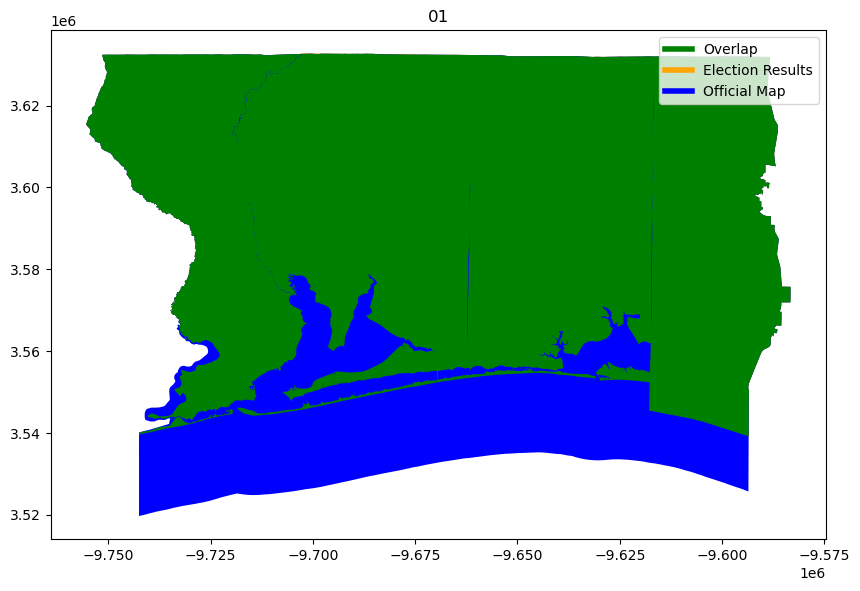

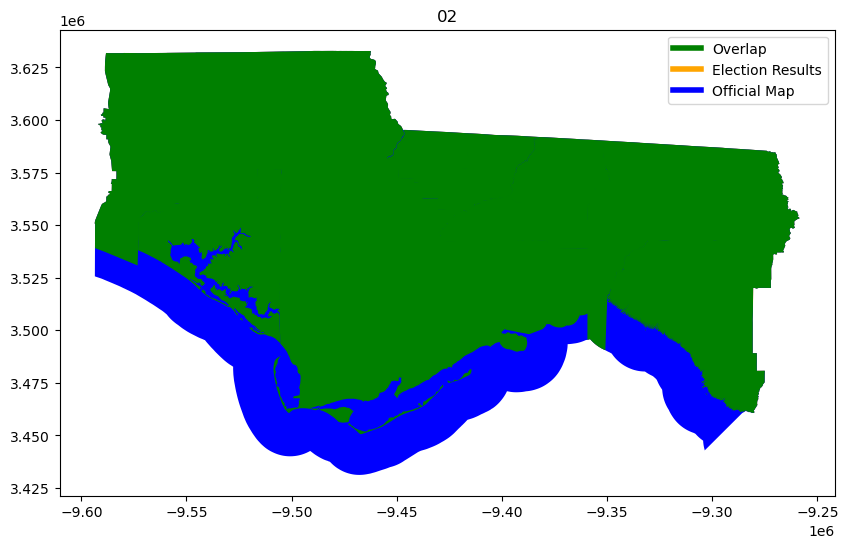

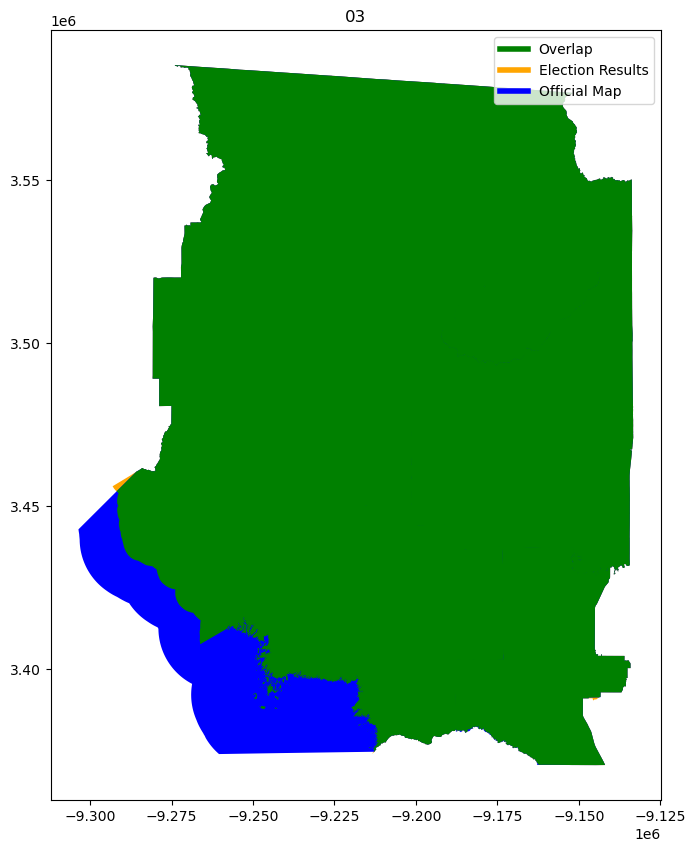

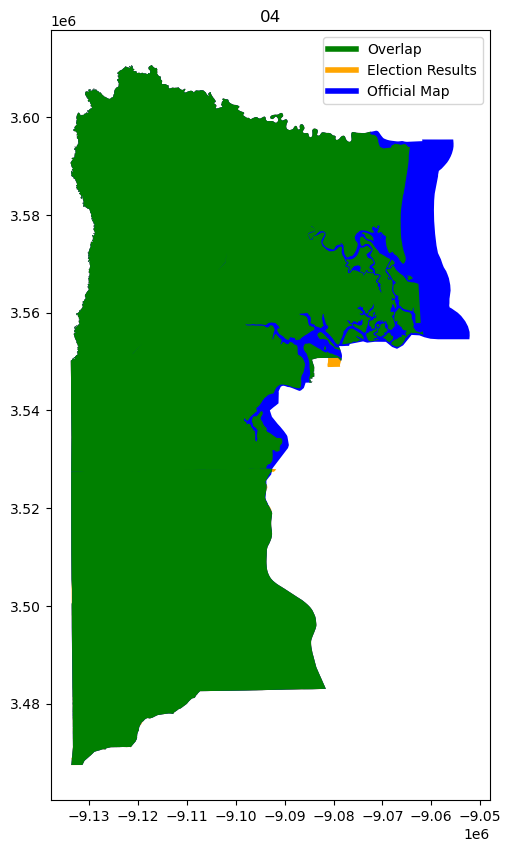

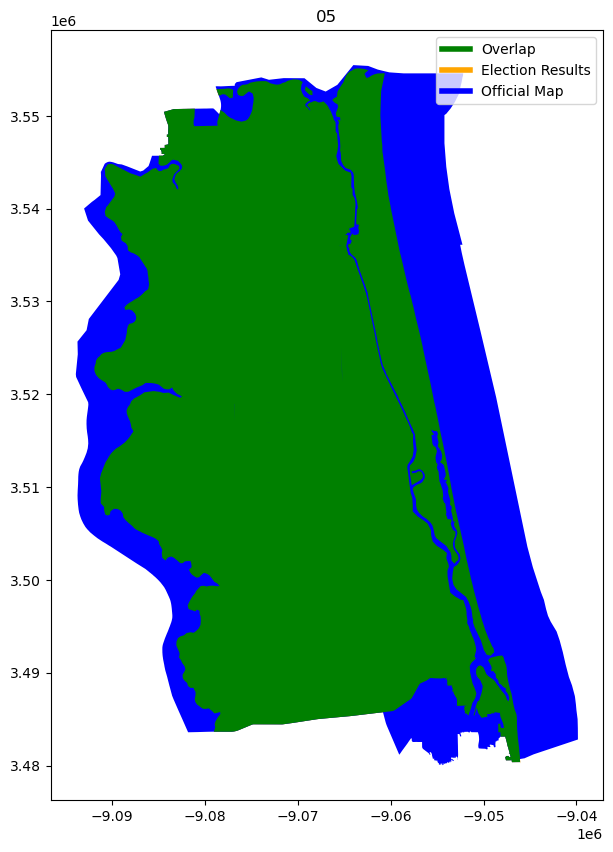

...

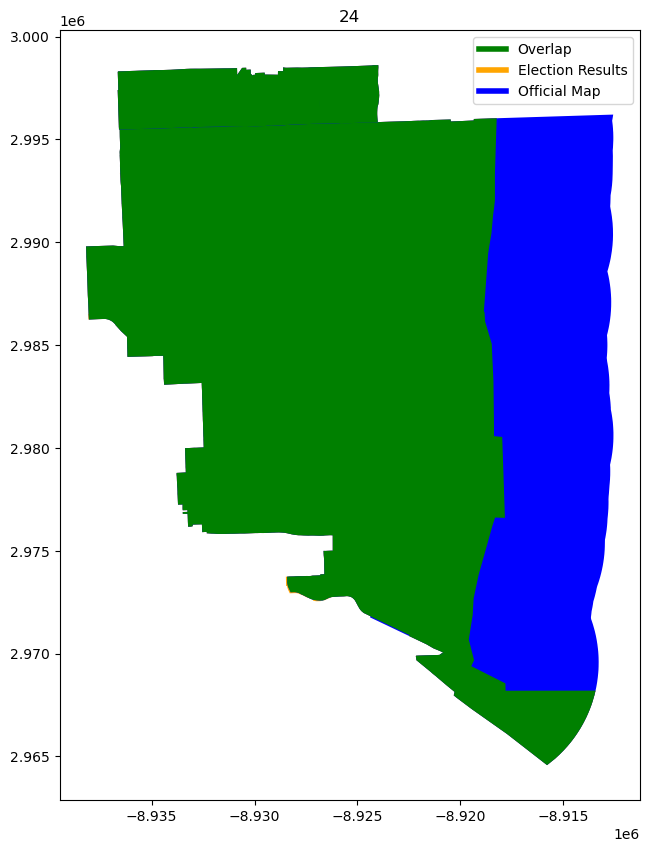

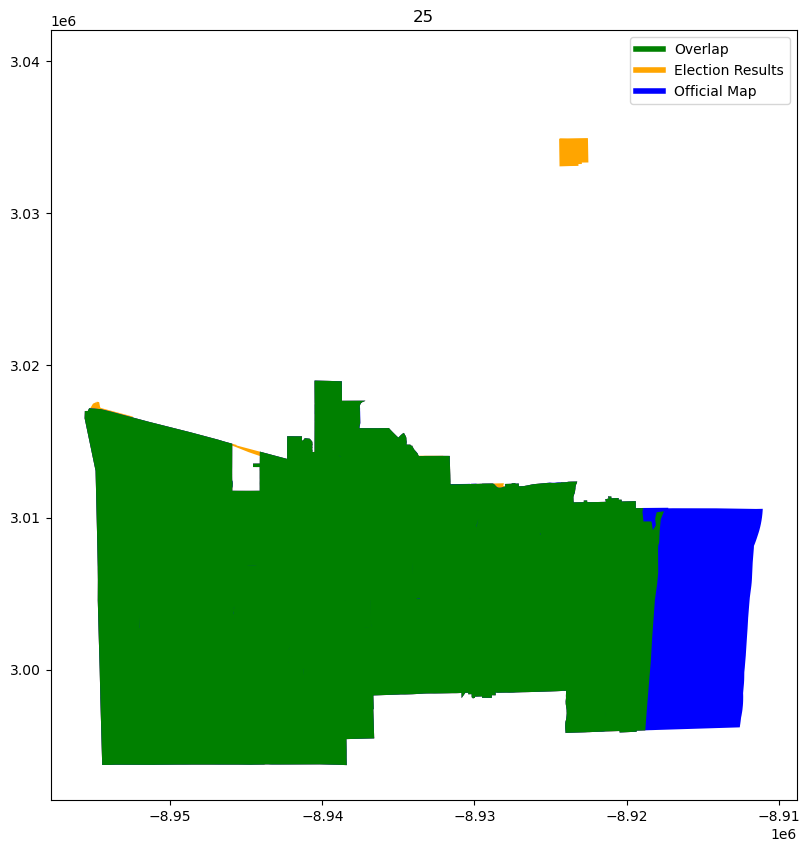

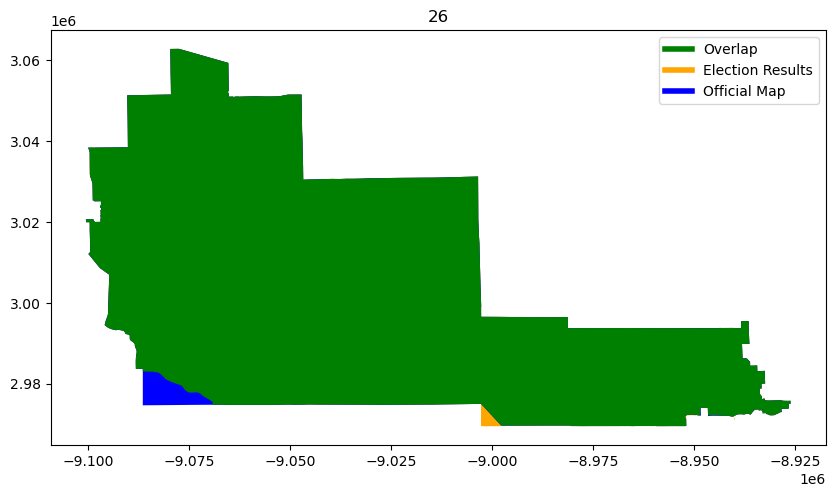

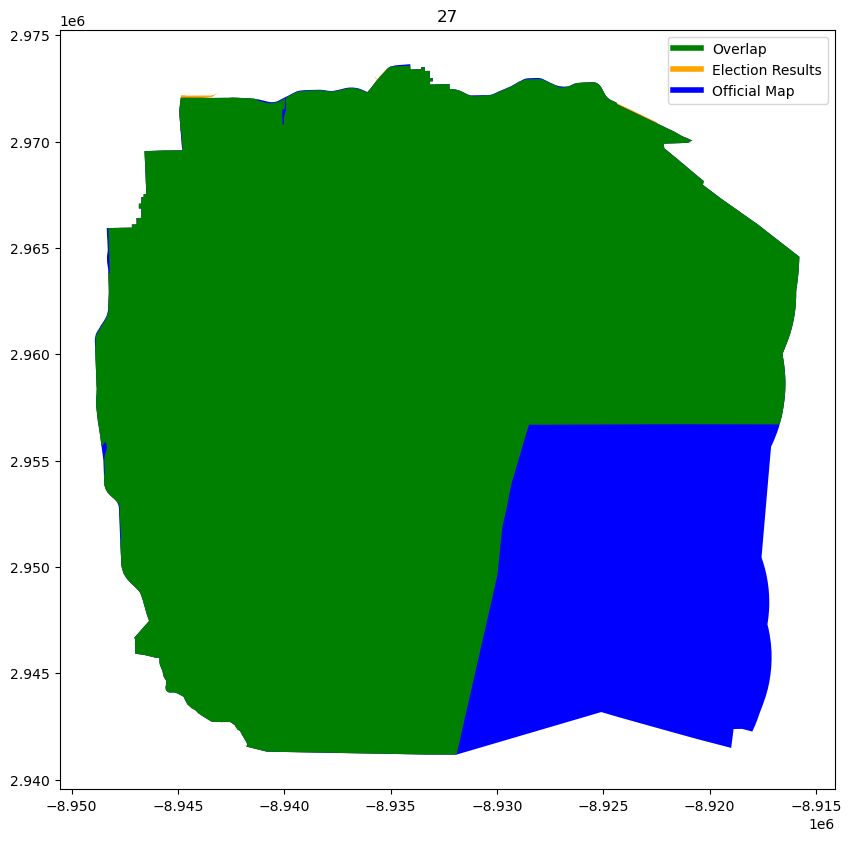

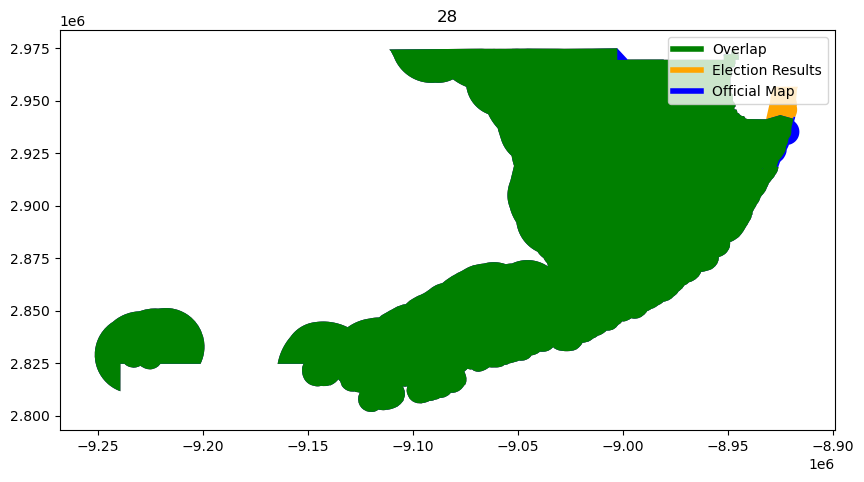

In [278]:
intersected = gp.overlay(cong, na_values, how = "intersection")


# Create a dictionary to map
intersected['area'] = intersected.area
na_assignment_dict = {}
for val in intersected["UNIQUE_ID"].unique():

    assignment = intersected.loc[intersected["UNIQUE_ID"] == val].nlargest(1, 'area')["HOUSE_DIST"].values[0]
    na_assignment_dict[val] = assignment
    
    
pber_w_splits["CONG_DIST"] = pber_w_splits["UNIQUE_ID"].map(na_assignment_dict).fillna(pber_w_splits["CONG_DIST"])


assigned_districts = pber_w_splits.dissolve(["CONG_DIST"])
assigned_districts.reset_index(drop=False,inplace=True)


cong["CONG_DIST"] = cong["HOUSE_DIST"]


compare_geometries(assigned_districts, cong ,"Election Results", "Official Map", "CONG_DIST",area_threshold=.1)

<Axes: >

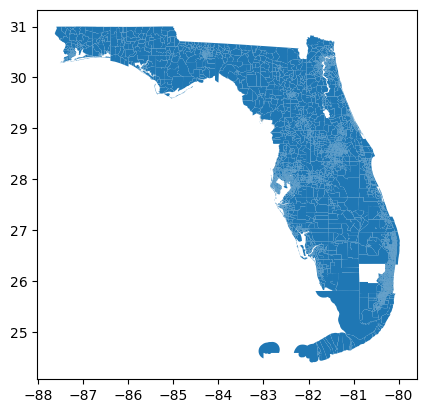

In [279]:
pber_w_splits.plot()

### Rename DF

In [280]:
#Saving to different DF for later export
#'pber_w_splits' will be reset for other splits
pber_cong_splits = pber_w_splits

## State Senate

### Split

In [281]:
pber = join

In [282]:
#2022 FL State Senate plan
sldu = gp.read_file('./raw-from-source/fl_sldu_adopted_2022/S027S8058.shp')
sldu = sldu.to_crs(pber.crs)

In [283]:
#Election gdf to be modified
pber["SLDU_DIST"] = 0

pber_sldu = pber[["UNIQUE_ID","CNTY_CODE","CNTY_NAME","SLDU_DIST"]+list(pber.columns[(pber.columns.str.startswith("GSU"))])+["geometry"]]

In [284]:
#Fill null as zero
pber_sldu.loc[:, pber_sldu.columns.str.startswith('GSU')] = pber_sldu.loc[:, pber_sldu.columns.str.startswith('GSU')].fillna(0)

In [285]:
def is_split_precinct(district_assignment_list):
    '''
    input: list of precincts and district assignments
    fxn: evaluate if precinct has one or more district assignments
    return: 0 if precinct:district is 1:1 assignment, or return assignment 
    '''
    c = Counter([x[0] for x in district_assignment_list])
    greater_than_one = {x:[y[1] for y in district_assignment_list if y[0]==x] for x, count in c.items() if count > 1}
    if len(greater_than_one)==0:
        return 0
    else:
        return greater_than_one
    
def get_level_dist(column_name):
    if column_name[0:4] == "GSLP":
        level = "SL"
        dist = "004"
    elif column_name[0:3] == "GSU":
        level = "SU"
        dist = column_name[3:5]
    elif column_name[0:3] == "GCO":
        level = "CON"
        dist = column_name[4:6]
    else:
        print(column_name)
        raise ValueError
    return level,dist


def return_su(row):
    for val in races:
        if row[val] != 0:
            return val[3:5]
        

races = [i for i in list(pber_sldu.columns) if "GSU" in i]
precinct_mapping_dict = {}
split_precincts_list = {}
for index,row in pber_sldu.iterrows():
    precinct_list = []
    for contest in races:
        if(row[contest]!=0):
            precinct_info = get_level_dist(contest)
            if precinct_info not in precinct_list:
                precinct_list.append(get_level_dist(contest))
    is_split = is_split_precinct(precinct_list)
    if (is_split):
        split_precincts_list[row["UNIQUE_ID"]]=is_split
    precinct_mapping_dict[row["UNIQUE_ID"]]=precinct_list
    

#Standardize district format with name different from PBER to use later and distinguish when splits occur
sldu['FL_SEN_DIST']=sldu["DISTRICT"].astype(str).str.zfill(2)
pber_sldu["SLDU_DIST"] = pber_sldu.apply(lambda row: return_su(row), axis = 1)


split_precincts_list

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


{'OKA-0005': {'SU': ['01', '02']},
 'OKA-0006': {'SU': ['01', '02']},
 'OKA-0011': {'SU': ['01', '02']},
 'DUV-0403': {'SU': ['04', '05']},
 'DUV-0703': {'SU': ['04', '05']},
 'DUV-0705': {'SU': ['04', '05']},
 'DUV-0813': {'SU': ['04', '05']},
 'DUV-1105': {'SU': ['04', '05']},
 'DUV-1212': {'SU': ['04', '05']},
 'LEE-0210': {'SU': ['27', '33']},
 'LEE-0405': {'SU': ['27', '33']},
 'LEE-0408': {'SU': ['27', '33']},
 'LEE-0513': {'SU': ['27', '33']},
 'LEE-0514': {'SU': ['27', '33']},
 'ORA-0341': {'SU': ['17', '25']},
 'ORA-0420': {'SU': ['17', '25']},
 'ORA-0504': {'SU': ['10', '17']},
 'ORA-0505': {'SU': ['10', '17']},
 'ORA-0522': {'SU': ['10', '17']},
 'ORA-0523': {'SU': ['10', '17']},
 'ORA-0530': {'SU': ['10', '17']}}

In [286]:
pber_sldu['SLDU_DIST'].unique()

array([None, '02', '27', '03', '01', '09', '30', '05', '04', '11', '13',
       '23', '21', '16', '18', '12', '10', '08', '14', '24', '26', '36',
       '38', '33', '25', '17'], dtype=object)

In [287]:
#Initialize new variable name to update in for loop
pber_w_splits = pber_sldu.copy()
for val in pber_sldu["UNIQUE_ID"]:
    cd_list = []
    if val in split_precincts_list.keys():
        print(val)
        pber_w_splits = district_splits_mod(split_precincts_list[val],"SLDU",val, pber_w_splits, sldu, "UNIQUE_ID", "FL_SEN_DIST", races, "SLDU_DIST")

OKA-0005
OKA-0006
OKA-0011
DUV-0403
DUV-0703
DUV-0705
DUV-0813
DUV-1105
DUV-1212
LEE-0210
LEE-0405
LEE-0408
LEE-0513
LEE-0514
ORA-0341
ORA-0420
ORA-0504
ORA-0505
ORA-0522
ORA-0523
ORA-0530


In [288]:
pber_w_splits[pber_w_splits['UNIQUE_ID'].str.contains("SLDU")]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDU_DIST,GSU01DNIC,GSU01RBRO,GSU02DZON,GSU02RTRU,GSU03DAUS,GSU03RSIM,...,GSU27RALB,GSU30DPOL,GSU30RREI,GSU33OWRI,GSU33RMAR,GSU36DPAC,GSU36RGAR,GSU38DPER,GSU38RCAL,geometry
5975,OKA-0005-(SLDU-01),OKA,Okaloosa,01,80.0,534.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.51793 30.99354 0.00000, -86.51..."
5976,OKA-0005-(SLDU-02),OKA,Okaloosa,02,0.0,0.0,10.0,123.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.38855 30.98815 0.00000, -86.38..."
5977,OKA-0006-(SLDU-01),OKA,Okaloosa,01,245.0,1249.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.54101 30.81256 0.00000, -86.54..."
5978,OKA-0006-(SLDU-02),OKA,Okaloosa,02,0.0,0.0,173.0,879.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.48783 30.90995 0.00000, -86.48..."
5979,OKA-0011-(SLDU-01),OKA,Okaloosa,01,1330.0,2010.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-86.56458 30.75418 0.00000, ..."
5980,OKA-0011-(SLDU-02),OKA,Okaloosa,02,0.0,0.0,476.0,1153.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.55872 30.76186 0.00000, -86.55..."
5981,DUV-0403-(SLDU-04),DUV,Duval,04,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.54035 30.28675 0.00000, -81.54..."
5982,DUV-0403-(SLDU-05),DUV,Duval,05,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-81.55929 30.28662 0.00000, -81.55..."
5983,DUV-0703-(SLDU-04),DUV,Duval,04,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-81.65221 30.46067 0.00000, ..."
5984,DUV-0703-(SLDU-05),DUV,Duval,05,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-81.61652 30.40382 0.00000, ..."


In [289]:
pber_w_splits[pber_w_splits["SLDU_DIST"].isna()]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDU_DIST,GSU01DNIC,GSU01RBRO,GSU02DZON,GSU02RTRU,GSU03DAUS,GSU03RSIM,...,GSU27RALB,GSU30DPOL,GSU30RREI,GSU33OWRI,GSU33RMAR,GSU36DPAC,GSU36RGAR,GSU38DPER,GSU38RCAL,geometry
0,BRA-0001,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
1,BRA-0002,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
2,BRA-0004,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
3,BRA-0006,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
4,BRA-0007,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5970,STL-0089,STL,St. Lucie,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-80.48133 27.23419, -80.48133 27.234..."
5971,STL-0090,STL,St. Lucie,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-80.48133 27.23419, -80.48132 27.231..."
5972,STL-0091,STL,St. Lucie,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-80.44538 27.32734, -80.44596 27.326..."
5973,STL-0094,STL,St. Lucie,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-80.63568 27.47071, -80.63689 27.470..."


In [290]:
pber_w_splits.shape

(6020, 56)

In [291]:
pber_w_splits.head()

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDU_DIST,GSU01DNIC,GSU01RBRO,GSU02DZON,GSU02RTRU,GSU03DAUS,GSU03RSIM,...,GSU27RALB,GSU30DPOL,GSU30RREI,GSU33OWRI,GSU33RMAR,GSU36DPAC,GSU36RGAR,GSU38DPER,GSU38RCAL,geometry
0,BRA-0001,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
1,BRA-0002,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
2,BRA-0004,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
3,BRA-0006,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
4,BRA-0007,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."


### Check vote totals post-split

In [292]:
#Temporary DFs dropping geometry columns
#pber_no_geo = pber.drop(columns=['geometry'])
#pber_splits_no_geo = pber_w_splits.drop(columns=['geometry'])

county_totals_check(pber, "pber", pber_w_splits, "join",races, "CNTY_CODE")

***Countywide Totals Check***

GSU01DNIC  is equal across all counties
GSU01RBRO  is equal across all counties
GSU02DZON  is equal across all counties
GSU02RTRU  is equal across all counties
GSU03DAUS  is equal across all counties
GSU03RSIM  is equal across all counties
GSU04DSMI  is equal across all counties
GSU04RYAR  is equal across all counties
GSU05DDAV  is equal across all counties
GSU05OWRI  is equal across all counties
GSU05RKUM  is equal across all counties
GSU08DWIL  is equal across all counties
GSU08RWRI  is equal across all counties
GSU09DLON  is equal across all counties
GSU09RPER  is equal across all counties
GSU10DGOF  is equal across all counties
GSU10RBRO  is equal across all counties
GSU11GMOO  is equal across all counties
GSU11RING  is equal across all counties
GSU12DDOK  is equal across all counties
GSU12RBUR  is equal across all counties
GSU13DDUK  is equal across all counties
GSU13RBAX  is equal across all counties
GSU14DCRU  is equal across all counties
GSU14RCOL

In [293]:
statewide_totals_check(pber, "pber", pber_w_splits, "join",races)

***Statewide Totals Check***
GSU01DNIC  is equal 	 both dataframes  58724.0
GSU01RBRO  is equal 	 both dataframes  145155.0
GSU02DZON  is equal 	 both dataframes  43498.0
GSU02RTRU  is equal 	 both dataframes  159041.0
GSU03DAUS  is equal 	 both dataframes  100696.0
GSU03RSIM  is equal 	 both dataframes  113477.0
GSU04DSMI  is equal 	 both dataframes  71472.0
GSU04RYAR  is equal 	 both dataframes  149177.0
GSU05DDAV  is equal 	 both dataframes  86784.0
GSU05OWRI  is equal 	 both dataframes  450.0
GSU05RKUM  is equal 	 both dataframes  64028.0
GSU08DWIL  is equal 	 both dataframes  78085.0
GSU08RWRI  is equal 	 both dataframes  133012.0
GSU09DLON  is equal 	 both dataframes  71276.0
GSU09RPER  is equal 	 both dataframes  135568.0
GSU10DGOF  is equal 	 both dataframes  95390.0
GSU10RBRO  is equal 	 both dataframes  114021.0
GSU11GMOO  is equal 	 both dataframes  64119.0
GSU11RING  is equal 	 both dataframes  192167.0
GSU12DDOK  is equal 	 both dataframes  59734.0
GSU12RBUR  is equal 	 bo

### Check district assignments

In [294]:
## Intersect the District with FL_SLDU to fill in the n/a values
na_values = pber_w_splits[pber_w_splits["SLDU_DIST"].isna()]
others = pber_w_splits[~(pber_w_splits["SLDU_DIST"].isna())]


print(pber_w_splits.shape)
print(others.shape)
print(na_values.shape)

(6020, 56)
(3804, 56)
(2216, 56)


/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/4200679357.py:1: UserWarning: `keep_geom_type=True` in overlay resulted in 123 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  intersected = gp.overlay(sldu, na_values, how = "intersection")
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/4200679357.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersected['area'] = intersected.area


Checking 40 precincts for differences of greater than 0.1 km^2

1) For 01 difference in area is 227.8678553837266
2) For 02 difference in area is 409.6525084460465
3) For 03 difference in area is 658.737350508461
4) For 04 difference in area is 60.13310878096764
5) For 05 difference in area is 12.07866469551067
6) For 06 difference in area is 6.1747771230660256
7) For 07 difference in area is 149.2020664801756
8) For 08 difference in area is 74.21132945287634
9) For 09 difference in area is 161.33424159100957
10) For 10 difference in area is 0.8183984401574644
11) For 11 difference in area is 164.062945221175
12) For 13 difference in area is 2.921450719116914
13) For 14 difference in area is 18.814558901523604
14) For 15 difference in area is 6.298184161542199
15) For 16 difference in area is 48.20882759186077
16) For 17 difference in area is 1.2870264129150581
17) For 18 difference in area is 102.78272911896156
18) For 19 difference in area is 70.70120250460988
19) For 20 difference i

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/plotting.py:684: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


26) For 27 difference in area is 77.3548761714304
27) For 28 difference in area is 164.78950912241586
28) For 29 difference in area is 57.61819086365223
29) For 30 difference in area is 1.640125407877698
30) For 31 difference in area is 145.61712853904876
31) For 32 difference in area is 0.4534148554971707
32) For 33 difference in area is 235.58748006032943
33) For 34 difference in area is 16.118259360438277
34) For 35 difference in area is 254.23878192031216
35) For 36 difference in area is 1.637253081885053
36) For 37 difference in area is 28.05994889592189
37) For 38 difference in area is 20.106815400803043
38) For 39 difference in area is 0.1111010448458767
39) For 40 difference in area is 23.442472486893493

Scroll down to see plots of any differences

Of the 40 precincts:

0 precincts w/ a difference of 0 km^2
1 precincts w/ a difference between 0 and .1 km^2
2 precincts w/ a difference between .1 and .5 km^2
2 precincts w/ a difference between .5 and 1 km^2
3 precincts w/ a diff

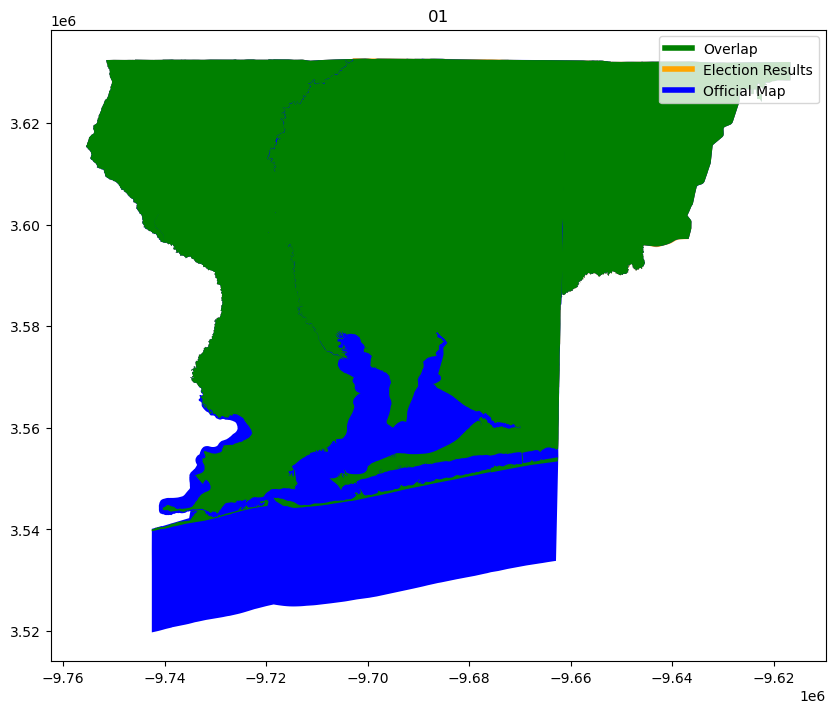

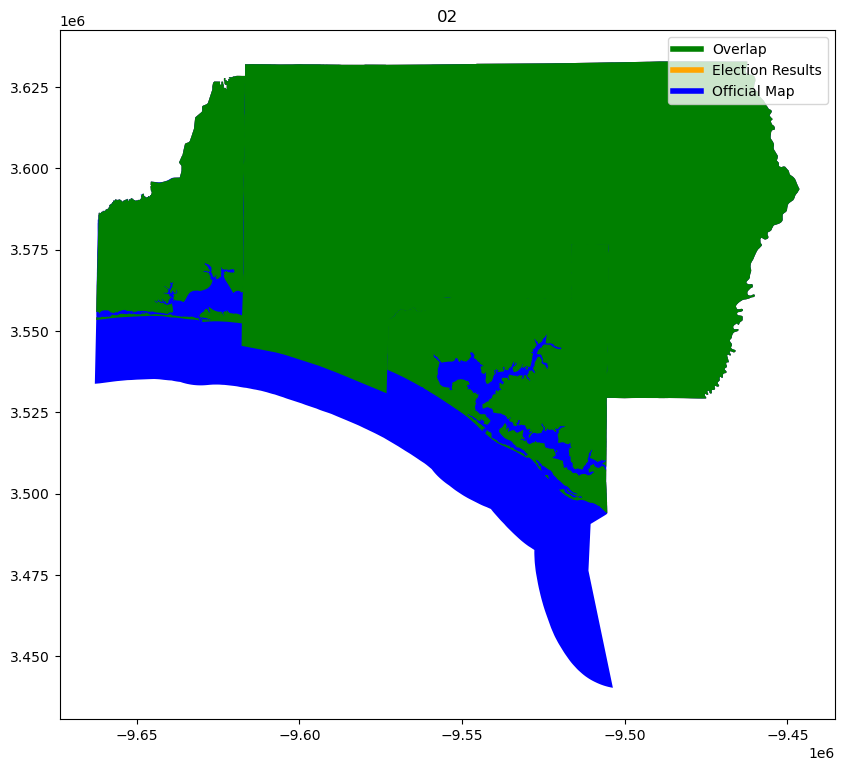

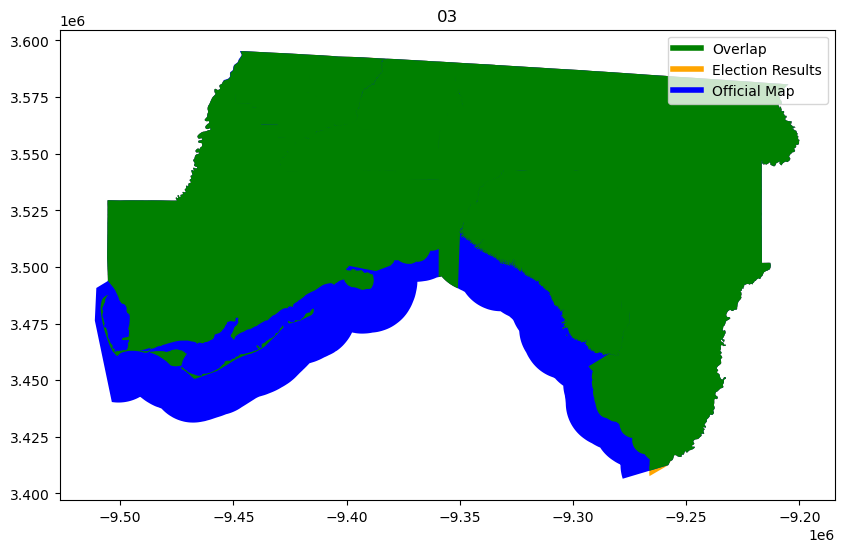

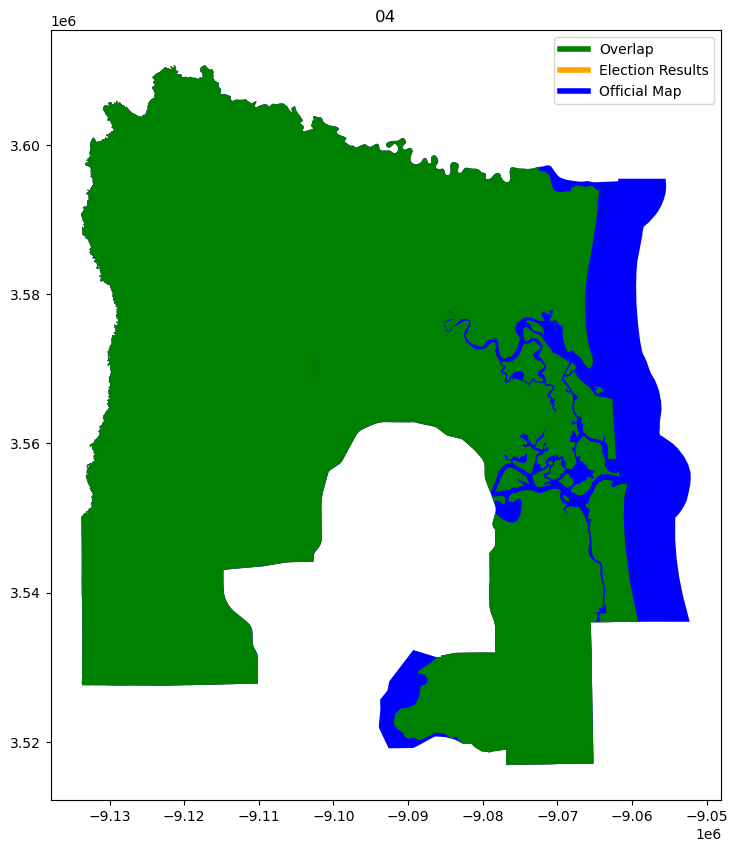

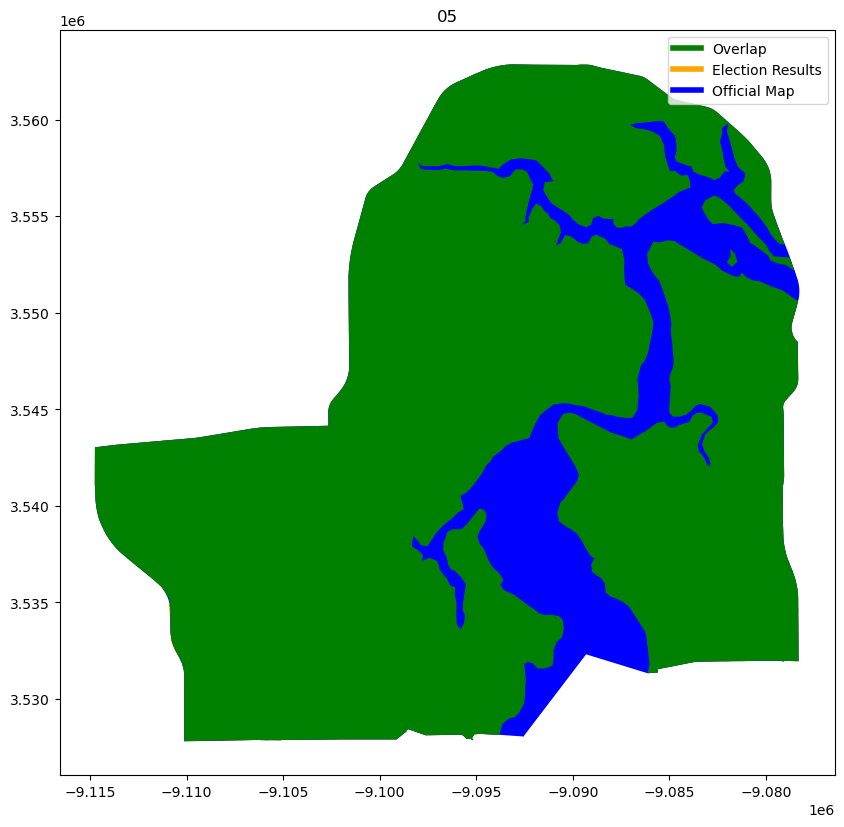

...

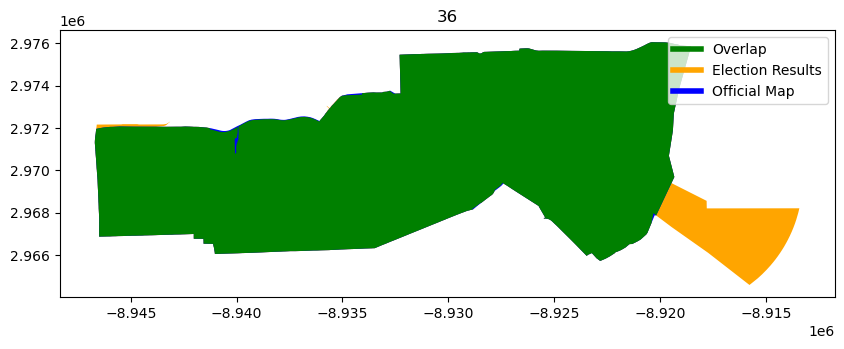

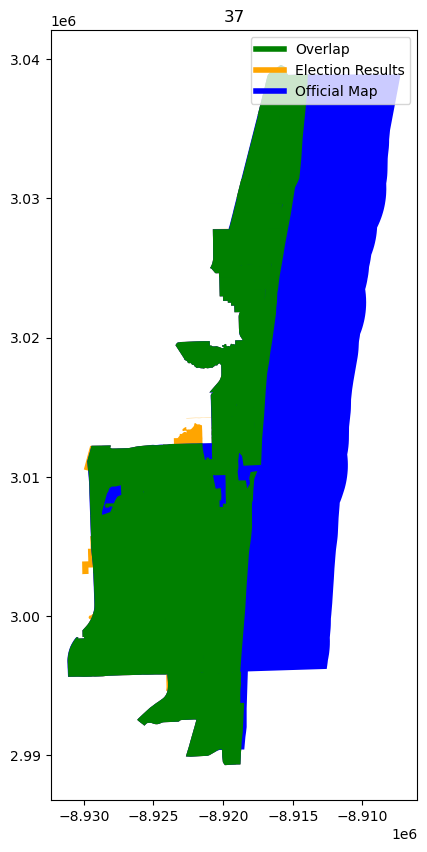

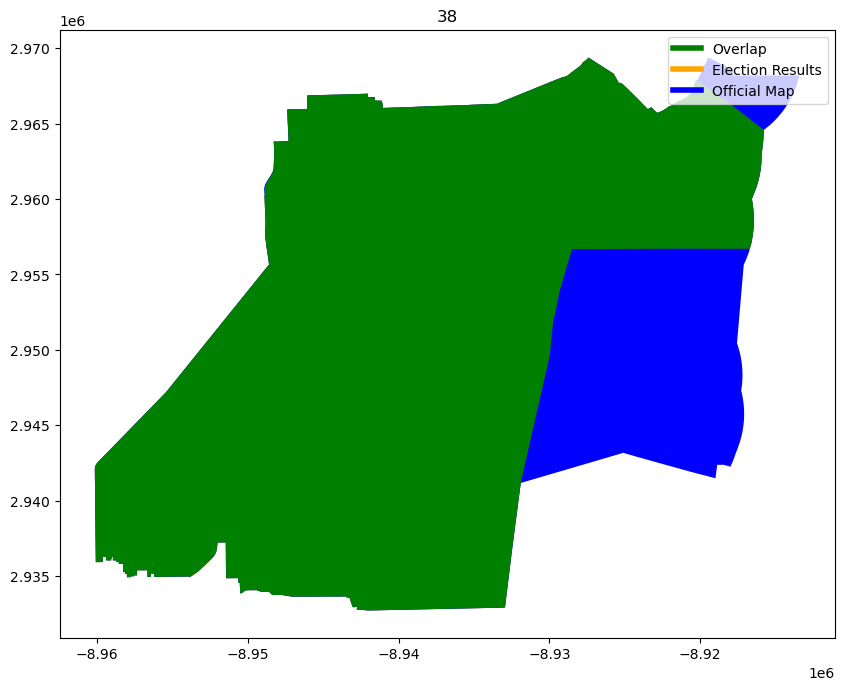

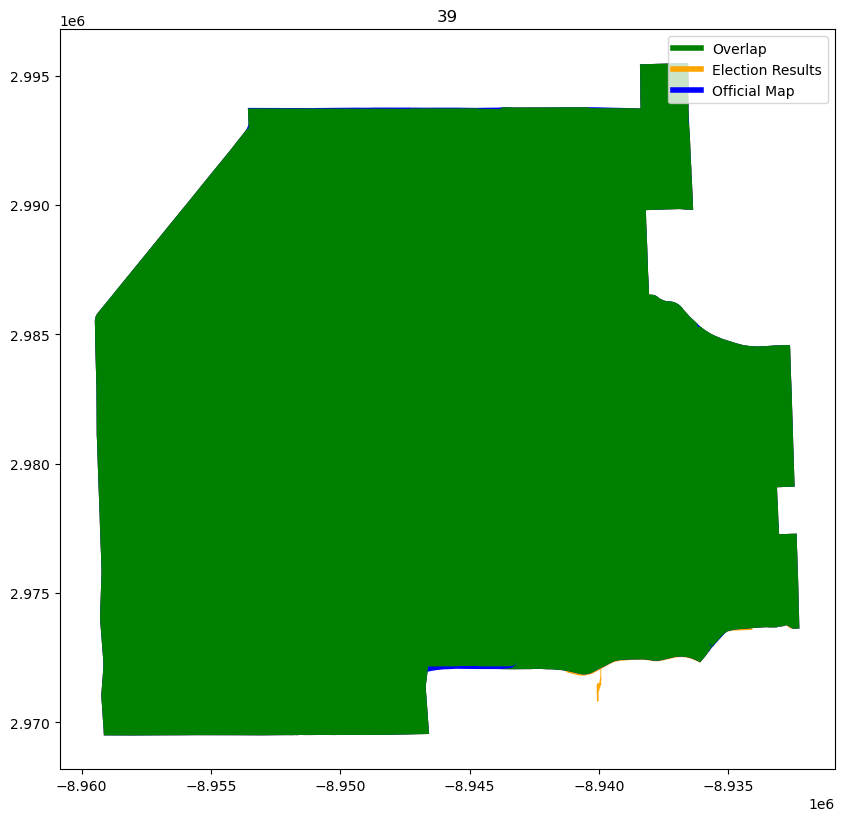

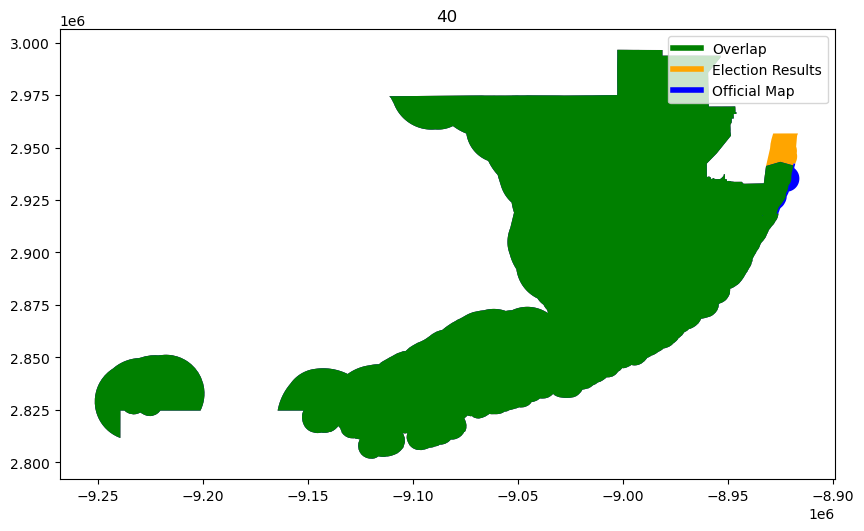

In [295]:
intersected = gp.overlay(sldu, na_values, how = "intersection")


# Create a dictionary to map
intersected['area'] = intersected.area
na_assignment_dict = {}
for val in intersected["UNIQUE_ID"].unique():

    assignment = intersected.loc[intersected["UNIQUE_ID"] == val].nlargest(1, 'area')["FL_SEN_DIST"].values[0]
    na_assignment_dict[val] = assignment
    
    
pber_w_splits["SLDU_DIST"] = pber_w_splits["UNIQUE_ID"].map(na_assignment_dict).fillna(pber_w_splits["SLDU_DIST"])


assigned_districts = pber_w_splits.dissolve(["SLDU_DIST"])
assigned_districts.reset_index(drop=False,inplace=True)


sldu["SLDU_DIST"] = sldu["FL_SEN_DIST"]


compare_geometries(assigned_districts, sldu ,"Election Results", "Official Map", "SLDU_DIST",area_threshold=.1)

<Axes: >

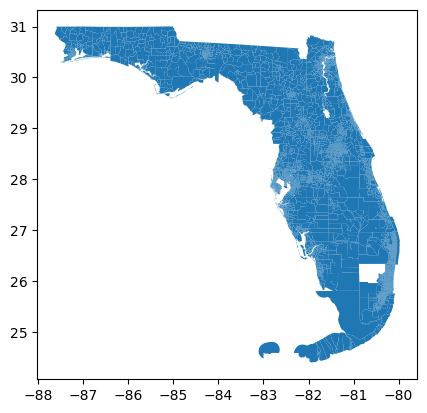

In [296]:
pber_w_splits.plot()

### Rename DF

In [297]:
#Saving to different DF for later export
#'pber_w_splits' will be reset for other splits
pber_sldu_splits = pber_w_splits

## State House

### Split

In [298]:
pber = join

In [299]:
#2022 FL State House plan
sldl = gp.read_file('./raw-from-source/fl_sldl_adopted_2022/H000H8013.shp')
sldl = sldl.to_crs(pber.crs)

In [300]:
#Election gdf to be modified
pber["SLDL_DIST"] = 0

pber_sldl = pber[["UNIQUE_ID","CNTY_CODE","CNTY_NAME","SLDL_DIST"]+list(pber.columns[(pber.columns.str.startswith("GSL"))])+["geometry"]]

In [301]:
def is_split_precinct(district_assignment_list):
    '''
    input: list of precincts and district assignments
    fxn: evaluate if precinct has one or more district assignments
    return: 0 if precinct:district is 1:1 assignment, or return assignment 
    '''
    c = Counter([x[0] for x in district_assignment_list])
    greater_than_one = {x:[y[1] for y in district_assignment_list if y[0]==x] for x, count in c.items() if count > 1}
    if len(greater_than_one)==0:
        return 0
    else:
        return greater_than_one
    
def get_level_dist(column_name):
    if column_name[0:4] == "GSLP":
        level = "SL"
        dist = "004"
    elif column_name[0:3] == "GSL":
        level = "SL"
        dist = column_name[3:6]
    elif column_name[0:3] == "GCO":
        level = "CON"
        dist = column_name[4:6]
    else:
        print(column_name)
        raise ValueError
    return level,dist


def return_sldl(row):
    for val in races:
        if row[val] != 0:
            return val[3:6]

races = [i for i in list(pber_sldl.columns) if "GSL" in i]
precinct_mapping_dict = {}
split_precincts_list = {}
for index,row in pber_sldl.iterrows():
    precinct_list = []
    for contest in races:
        if(row[contest]!=0):
            precinct_info = get_level_dist(contest)
            if precinct_info not in precinct_list:
                precinct_list.append(get_level_dist(contest))
    is_split = is_split_precinct(precinct_list)
    if (is_split):
        split_precincts_list[row["UNIQUE_ID"]]=is_split
    precinct_mapping_dict[row["UNIQUE_ID"]]=precinct_list
    

#Standardize district format with name different from PBER to use later and distinguish when splits occur
sldl['FL_HOUSE_DIST']=sldl["DISTRICT"].astype(str).str.zfill(3)
pber_sldl["SLDL_DIST"] = pber_sldl.apply(lambda row: return_sldl(row), axis = 1)

split_precincts_list

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


{'MRT-0004': {'SL': ['085', '086']},
 'SAN-0035': {'SL': ['002', '003']},
 'SAN-0040': {'SL': ['002', '003']},
 'SAN-0023': {'SL': ['002', '003']},
 'SAN-0029': {'SL': ['002', '003']},
 'SAN-0026': {'SL': ['002', '003']},
 'MRT-0001': {'SL': ['085', '086']},
 'MRT-0002': {'SL': ['085', '086']},
 'BRO-0345': {'SL': ['096', '103']},
 'DUV-0310': {'SL': ['016', '017']},
 'DUV-0813': {'SL': ['013', '015']},
 'DUV-0814': {'SL': ['013', '015']},
 'DUV-1209': {'SL': ['013', '015']},
 'VOL-0418': {'SL': ['029', '030']},
 'VOL-0710': {'SL': ['028', '030']},
 'VOL-0720': {'SL': ['029', '030']},
 'HIL-0433': {'SL': ['065', '066']},
 'HIL-0507': {'SL': ['065', '066']},
 'ESC-0108': {'SL': ['001', '002']},
 'ESC-0110': {'SL': ['001', '002']},
 'ESC-0113': {'SL': ['001', '002']},
 'LEE-0201': {'SL': ['077', '078']},
 'LEE-0204': {'SL': ['077', '078']},
 'LEE-0205': {'SL': ['077', '078']},
 'LEE-0208': {'SL': ['077', '078']},
 'LEE-0215': {'SL': ['077', '080']},
 'LEE-0307': {'SL': ['077', '080']},
 

In [302]:
pber_sldl['SLDL_DIST'].unique()

array([None, '003', '086', '085', '008', '022', '002', '120', '100',
       '096', '103', '105', '101', '016', '015', '017', '013', '053',
       '052', '034', '025', '026', '070', '072', '054', '055', '062',
       '060', '061', '059', '058', '073', '036', '039', '038', '037',
       '019', '028', '029', '030', '080', '021', '033', '011', '065',
       '064', '066', '067', '068', '069', '089', '090', '094', '091',
       '093', '088', '087', '092', '106', '113', '119', '118', '114',
       '115', '001', '077', '078', '045', '041', '040', '042', '043',
       '035', '047', '046', '084'], dtype=object)

In [303]:
#Initialize new variable name to update in for loop
pber_w_splits = pber_sldl.copy()
for val in pber_sldl["UNIQUE_ID"]:
    cd_list = []
    if val in split_precincts_list.keys():
        print(val)
        pber_w_splits = district_splits_mod(split_precincts_list[val],"SLDL",val, pber_w_splits, sldl, "UNIQUE_ID", "FL_HOUSE_DIST", races, "SLDL_DIST")

MRT-0004
SAN-0035
SAN-0040
SAN-0023
SAN-0029
SAN-0026
MRT-0001
MRT-0002
BRO-0345
DUV-0310
DUV-0813
DUV-0814
DUV-1209
VOL-0418
VOL-0710
VOL-0720
HIL-0433
HIL-0507
ESC-0108
ESC-0110
ESC-0113
LEE-0201
LEE-0204
LEE-0205
LEE-0208
LEE-0215
LEE-0307
LEE-0314
LEE-0315
LEE-0316
LEE-0317
LEE-0318
LEE-0319
LEE-0320
LEE-0503
LEE-0504
ORA-0108
ORA-0111
ORA-0201
ORA-0206
ORA-0220
ORA-0221
ORA-0223
ORA-0305
ORA-0311
ORA-0312
ORA-0323
ORA-0324
ORA-0336
ORA-0338
ORA-0339
ORA-0402
ORA-0405
ORA-0416
ORA-0420
ORA-0438
ORA-0510
ORA-0520
ORA-0521
ORA-0526
ORA-0527
ORA-0530
ORA-0539
ORA-0540
ORA-0542
ORA-0543
ORA-0629
ORA-0630


In [304]:
pber_w_splits[pber_w_splits['UNIQUE_ID'].str.contains("SLDL")]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDL_DIST,GSL001DMAT,GSL001RSAL,GSL002DTAY,GSL002RAND,GSL003OWRI,GSL003RRUD,...,GSL114RCAB,GSL115DDAV,GSL115RGAR,GSL118DFAR,GSL118RFER,GSL119DGON,GSL119RPOR,GSL120DGEN,GSL120RMOO,geometry
5928,MRT-0004-(SLDL-085),MRT,Martin,085,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-80.24396 27.22096 0.00000, -80.24..."
5929,MRT-0004-(SLDL-086),MRT,Martin,086,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-80.23985 27.21249 0.00000, -80.23..."
5930,SAN-0035-(SLDL-002),SAN,Santa Rosa,002,0.0,0.0,124.0,387.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.79948 30.40960 0.00000, -86.79..."
5931,SAN-0035-(SLDL-003),SAN,Santa Rosa,003,0.0,0.0,0.0,0.0,114.0,1703.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.83433 30.43233 0.00000, -86.83..."
5932,SAN-0035-(SLDL-004),SAN,Santa Rosa,004,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-86.79888 30.43113 0.00000, ..."
5933,SAN-0040-(SLDL-002),SAN,Santa Rosa,002,0.0,0.0,245.0,679.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.89766 30.40184 0.00000, -86.89..."
5934,SAN-0040-(SLDL-003),SAN,Santa Rosa,003,0.0,0.0,0.0,0.0,8.0,53.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.89766 30.40193 0.00000, -86.89..."
5935,SAN-0023-(SLDL-002),SAN,Santa Rosa,002,0.0,0.0,323.0,949.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-87.03549 30.39874 0.00000, -87.03..."
5936,SAN-0023-(SLDL-003),SAN,Santa Rosa,003,0.0,0.0,0.0,0.0,39.0,789.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON Z (((-86.98681 30.41561 0.00000, ..."
5937,SAN-0029-(SLDL-002),SAN,Santa Rosa,002,0.0,0.0,38.0,91.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-86.87141 30.40155 0.00000, -86.87..."


In [305]:
pber_w_splits[pber_w_splits["SLDL_DIST"].isna()]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDL_DIST,GSL001DMAT,GSL001RSAL,GSL002DTAY,GSL002RAND,GSL003OWRI,GSL003RRUD,...,GSL114RCAB,GSL115DDAV,GSL115RGAR,GSL118DFAR,GSL118RFER,GSL119DGON,GSL119RPOR,GSL120DGEN,GSL120RMOO,geometry
0,BRA-0001,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
1,BRA-0002,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
2,BRA-0004,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
3,BRA-0006,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
4,BRA-0007,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5820,OSC-4008,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-81.30466 28.18929, -81.30435 28.187..."
5851,OSC-5013,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-81.04570 28.27507, -81.05859 28.275..."
5856,OSC-5204,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-81.24408 28.28961, -81.24405 ..."
5864,OSC-5506,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-81.20350 28.29870, -81.20317 28.298..."


In [306]:
pber_w_splits[pber_w_splits["SLDL_DIST"].isna()]

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDL_DIST,GSL001DMAT,GSL001RSAL,GSL002DTAY,GSL002RAND,GSL003OWRI,GSL003RRUD,...,GSL114RCAB,GSL115DDAV,GSL115RGAR,GSL118DFAR,GSL118RFER,GSL119DGON,GSL119RPOR,GSL120DGEN,GSL120RMOO,geometry
0,BRA-0001,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
1,BRA-0002,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
2,BRA-0004,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
3,BRA-0006,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
4,BRA-0007,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5820,OSC-4008,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-81.30466 28.18929, -81.30435 28.187..."
5851,OSC-5013,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-81.04570 28.27507, -81.05859 28.275..."
5856,OSC-5204,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-81.24408 28.28961, -81.24405 ..."
5864,OSC-5506,OSC,Osceola,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-81.20350 28.29870, -81.20317 28.298..."


In [307]:
pber_w_splits.head()

,UNIQUE_ID,CNTY_CODE,CNTY_NAME,SLDL_DIST,GSL001DMAT,GSL001RSAL,GSL002DTAY,GSL002RAND,GSL003OWRI,GSL003RRUD,...,GSL114RCAB,GSL115DDAV,GSL115RGAR,GSL118DFAR,GSL118RFER,GSL119DGON,GSL119RPOR,GSL120DGEN,GSL120RMOO,geometry
0,BRA-0001,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.12471 30.14321 0.00000, -82.11..."
1,BRA-0002,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04788 29.99894 0.00000, -82.04..."
2,BRA-0004,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.16923 30.04511 0.00000, -82.16..."
3,BRA-0006,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.21759 30.03316 0.00000, -82.21..."
4,BRA-0007,BRA,Bradford,None,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON Z ((-82.04772 29.98791 0.00000, -82.04..."


### Check vote totals post-split

In [308]:
#Temporary DFs dropping geometry columns
#pber_no_geo = pber.drop(columns=['geometry'])
#pber_splits_no_geo = pber_w_splits.drop(columns=['geometry'])

county_totals_check(pber, "pber", pber_w_splits, "join",races, "CNTY_CODE")

***Countywide Totals Check***

GSL001DMAT  is equal across all counties
GSL001RSAL  is equal across all counties
GSL002DTAY  is equal across all counties
GSL002RAND  is equal across all counties
GSL003OWRI  is equal across all counties
GSL003RRUD  is equal across all counties
GSL008DFRA  is equal across all counties
GSL008RBEN  is equal across all counties
GSL011DJON  is equal across all counties
GSL011RGAR  is equal across all counties
GSL013DNIX  is equal across all counties
GSL013NMAS  is equal across all counties
GSL015OWRI  is equal across all counties
GSL015RBLA  is equal across all counties
GSL016OWRI  is equal across all counties
GSL016RMIC  is equal across all counties
GSL017DAND  is equal across all counties
GSL017RBAK  is equal across all counties
GSL019DMOR  is equal across all counties
GSL019RREN  is equal across all counties
GSL021DHAY  is equal across all counties
GSL021RMER  is equal across all counties
GSL022DPET  is equal across all counties
GSL022RCLE  is equal acros

In [309]:
statewide_totals_check(pber, "pber", pber_w_splits, "join",races)

***Statewide Totals Check***
GSL001DMAT  is equal 	 both dataframes  19087.0
GSL001RSAL  is equal 	 both dataframes  43026.0
GSL002DTAY  is equal 	 both dataframes  25440.0
GSL002RAND  is equal 	 both dataframes  44459.0
GSL003OWRI  is equal 	 both dataframes  2173.0
GSL003RRUD  is equal 	 both dataframes  60263.0
GSL008DFRA  is equal 	 both dataframes  37452.0
GSL008RBEN  is equal 	 both dataframes  14870.0
GSL011DJON  is equal 	 both dataframes  18392.0
GSL011RGAR  is equal 	 both dataframes  51146.0
GSL013DNIX  is equal 	 both dataframes  34059.0
GSL013NMAS  is equal 	 both dataframes  14035.0
GSL015OWRI  is equal 	 both dataframes  4752.0
GSL015RBLA  is equal 	 both dataframes  63594.0
GSL016OWRI  is equal 	 both dataframes  4194.0
GSL016RMIC  is equal 	 both dataframes  52145.0
GSL017DAND  is equal 	 both dataframes  24303.0
GSL017RBAK  is equal 	 both dataframes  37989.0
GSL019DMOR  is equal 	 both dataframes  31578.0
GSL019RREN  is equal 	 both dataframes  56200.0
GSL021DHAY  is

### Check district assignments

In [310]:
## Intersect the District with FL_SLDL to fill in the n/a values
na_values = pber_w_splits[pber_w_splits["SLDL_DIST"].isna()]
others = pber_w_splits[~(pber_w_splits["SLDL_DIST"].isna())]


print(pber_w_splits.shape)
print(others.shape)
print(na_values.shape)

(6081, 157)
(3730, 157)
(2351, 157)


/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/3489040358.py:1: UserWarning: `keep_geom_type=True` in overlay resulted in 50 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  intersected = gp.overlay(sldl, na_values, how = "intersection")
/var/folders/4v/xw3fff217577d04_yzwdvz340000gn/T/ipykernel_56986/3489040358.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersected['area'] = intersected.area


Checking 120 precincts for differences of greater than 0.1 km^2

1) For 001 difference in area is 2.290877848430557
2) For 002 difference in area is 199.67825469585736
3) For 003 difference in area is 40.71335849255097
4) For 004 difference in area is 123.22415519394545
5) For 005 difference in area is 59.056916266717515
6) For 006 difference in area is 242.079881114046
7) For 007 difference in area is 663.2606547979188
8) For 008 difference in area is 0.8820730345517946
9) For 009 difference in area is 5.179341255048381
10) For 010 difference in area is 15.335730682774233
11) For 011 difference in area is 0.24241683333725678
12) For 012 difference in area is 12.819931185211123
13) For 013 difference in area is 0.5637375609796316
14) For 014 difference in area is 9.111072917251237
15) For 015 difference in area is 42.35818683977783
16) For 016 difference in area is 16.165345153609987
17) For 017 difference in area is 1.1026038701510814
18) For 018 difference in area is 56.3670434394532

/Users/grantschwab/anaconda3/envs/geo_env/lib/python3.12/site-packages/geopandas/plotting.py:684: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


22) For 022 difference in area is 154.87321030087958
23) For 023 difference in area is 63.62380085327723
24) For 024 difference in area is 0.18554843928164358
25) For 025 difference in area is 3.927305672123034
26) For 026 difference in area is 22.830888898779744
27) For 027 difference in area is 56.0222660006094
28) For 028 difference in area is 42.91385947869787
29) For 029 difference in area is 0.5248049399011067
30) For 030 difference in area is 64.24953437469524
31) For 031 difference in area is 44.09990574838925
32) For 032 difference in area is 7.318214103636478
33) For 033 difference in area is 9.29528334674204
34) For 034 difference in area is 44.24637249498763
35) For 039 difference in area is 0.47610854765693766
36) For 041 difference in area is 3.0448311094567133
37) For 042 difference in area is 6.422040078086591
38) For 044 difference in area is 11.484870188677588
39) For 045 difference in area is 1.3521012380112185
40) For 047 difference in area is 1.2318665809403961
41)

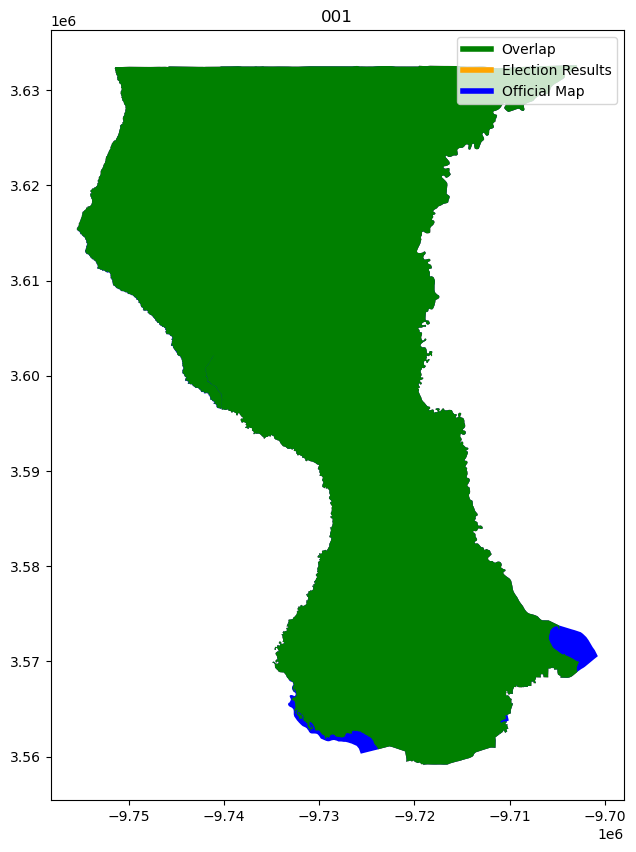

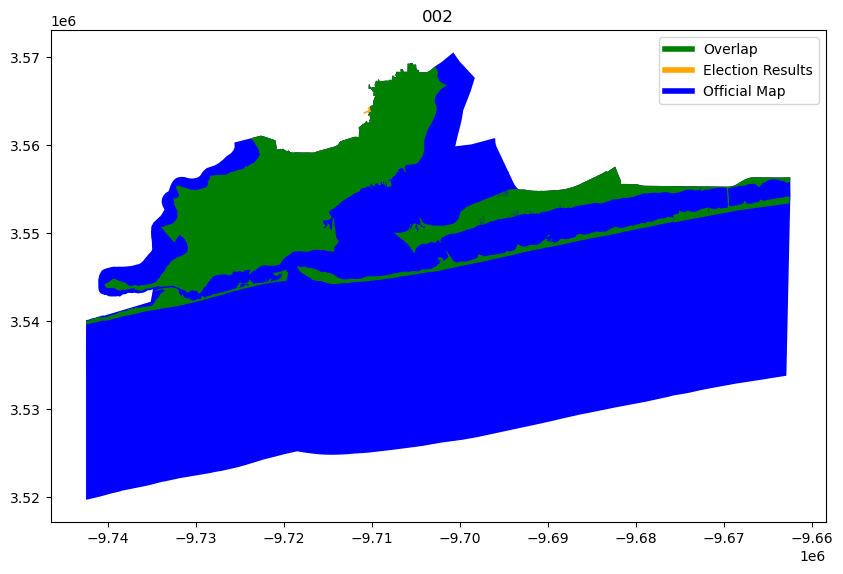

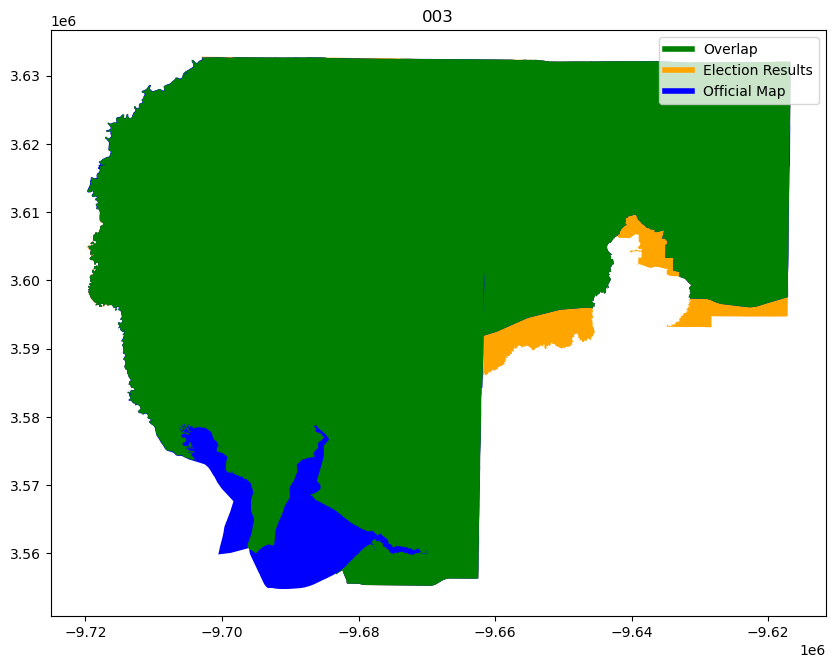

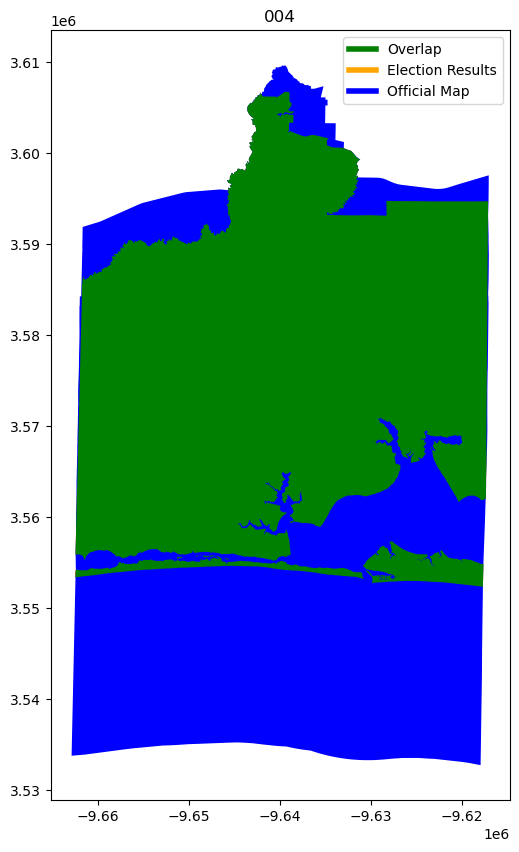

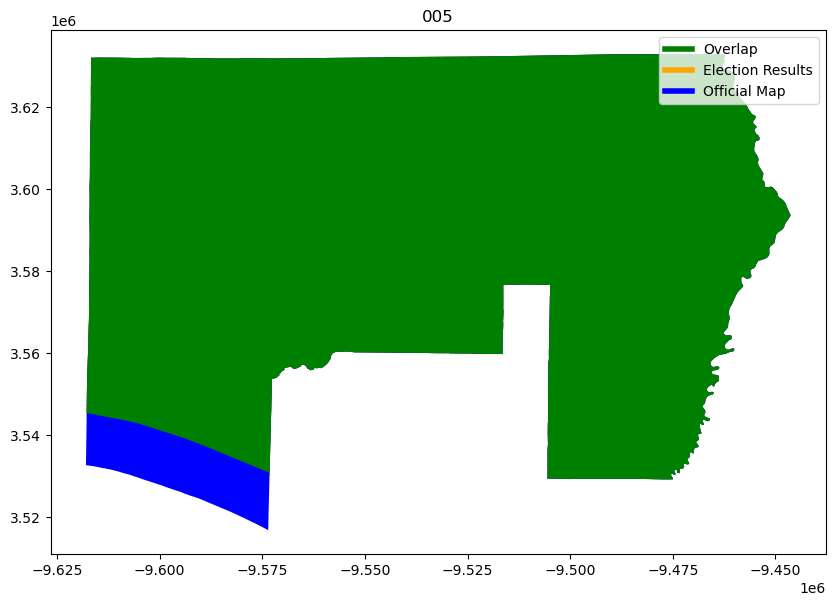

...

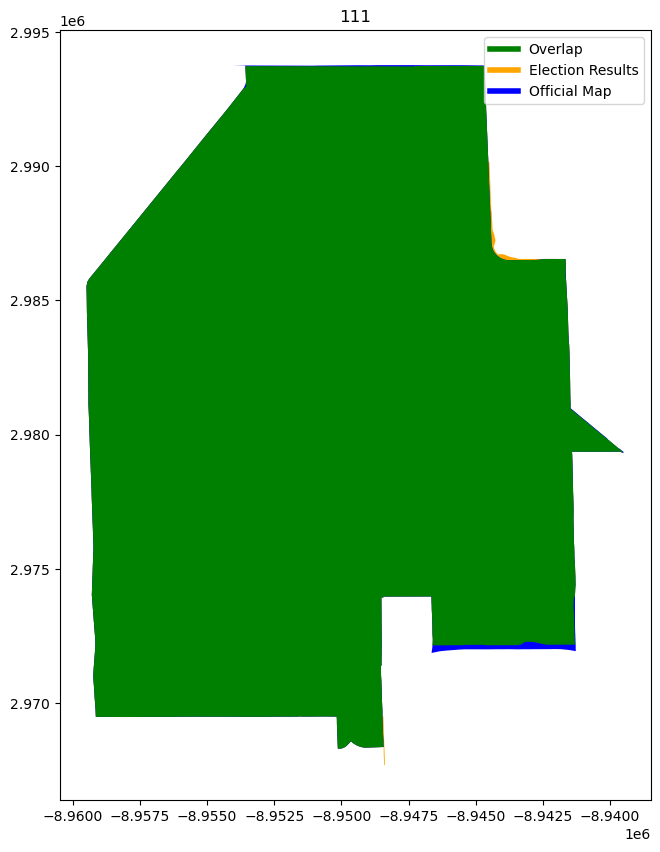

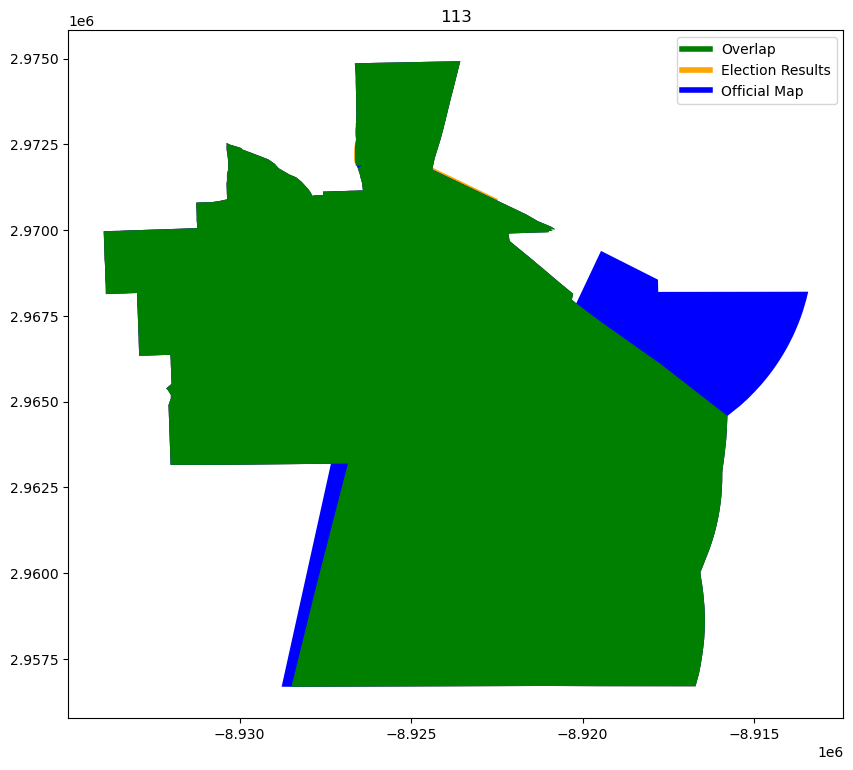

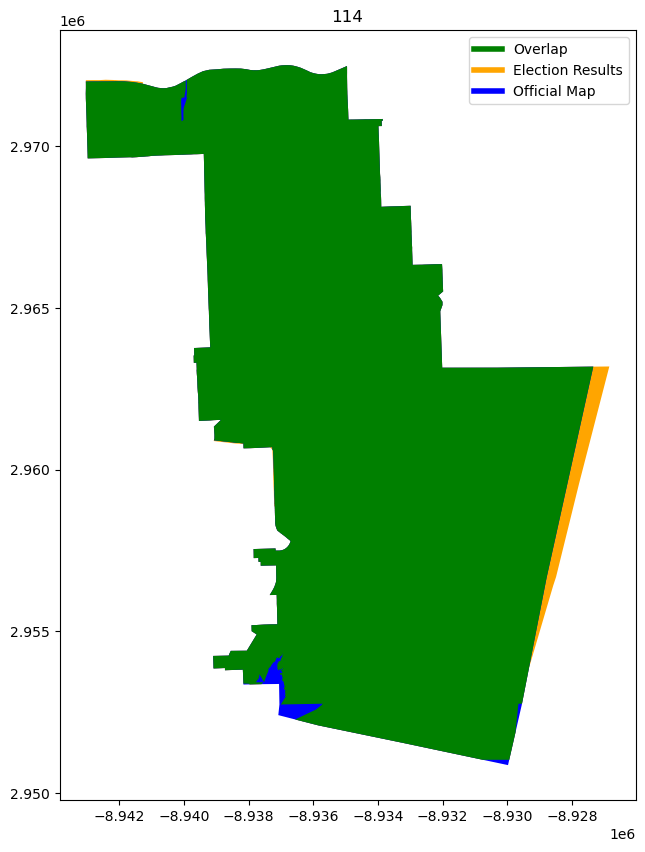

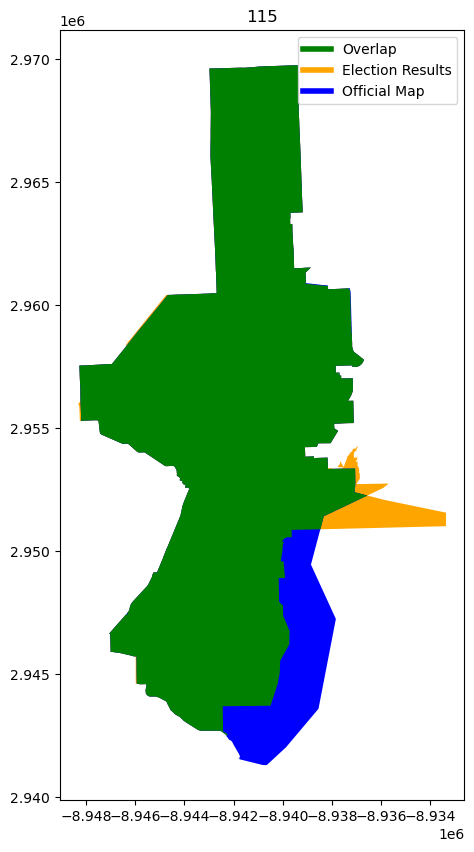

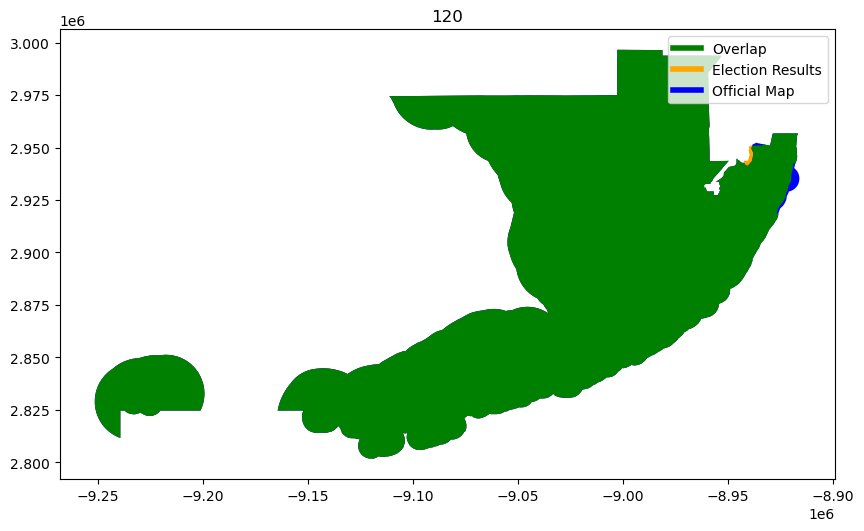

In [311]:
intersected = gp.overlay(sldl, na_values, how = "intersection")


# Create a dictionary to map
intersected['area'] = intersected.area
na_assignment_dict = {}
for val in intersected["UNIQUE_ID"].unique():

    assignment = intersected.loc[intersected["UNIQUE_ID"] == val].nlargest(1, 'area')["FL_HOUSE_DIST"].values[0]
    na_assignment_dict[val] = assignment
    
    
pber_w_splits["SLDL_DIST"] = pber_w_splits["UNIQUE_ID"].map(na_assignment_dict).fillna(pber_w_splits["SLDL_DIST"])


assigned_districts = pber_w_splits.dissolve(["SLDL_DIST"])
assigned_districts.reset_index(drop=False,inplace=True)


sldl["SLDL_DIST"] = sldl["FL_HOUSE_DIST"]


compare_geometries(assigned_districts, sldl ,"Election Results", "Official Map", "SLDL_DIST",area_threshold=.1)

<Axes: >

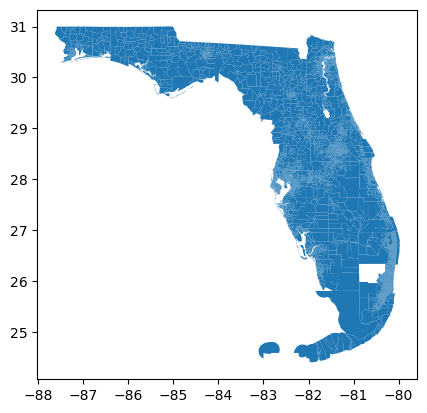

In [312]:
pber_w_splits.plot()

### Rename DF

In [313]:
#Saving to different DF for later export
#'pber_w_splits' will be reset for other splits
pber_sldl_splits = pber_w_splits

# Exports

Full map, no splits

In [314]:
join.to_file('./output/fl_gen_22_no_splits_prec', driver='ESRI Shapefile')

Statewide contests

In [315]:
statewide.to_file('./output/fl_gen_22_st_prec', driver='ESRI Shapefile')

Congress splits

In [316]:
pber_cong_splits.to_file('./output/fl_gen_22_cong_splits_prec', driver='ESRI Shapefile')

State Senate splits

In [317]:
pber_sldu_splits.to_file('./output/fl_gen_22_sldu_splits_prec', driver='ESRI Shapefile')

State House splits

In [318]:
pber_sldl_splits.to_file('./output/fl_gen_22_sldl_splits_prec', driver='ESRI Shapefile')